<a href="https://colab.research.google.com/github/Untick/InspectrumClinic_RS_gr1/blob/main/Gavrilkov%20Nikolay/internship.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Рекомендательная система для профпатолога (INSPECTRUM CLINIC)

# ТЕХНИЧЕСКОЕ ЗАДАНИЕ

Цель:
Разработать прототип системы, реализующей функцию рекомендательной системы для врача профпатолога.

## Принцип работы:
Система должна помогать врачу вынести решение о том годен, не годен или ограниченно годен человек на определенной должности.
В датасете целевым столбцом для предсказания нейросетью является столбец под названием: “ЗаключениеМК”.
Система может дополнять вердикт мнением, почему человек не годен, или почему ограниченно годен.

## Требования интерфейсу:
Минимальный уровень реализации: notebook google colaboratory. Требуется реализовать простой веб-интерфейс для загрузки анализируемого моделью нейросети набора данных и удобным выводом результатов вынесенного решения.

Дополнительно: передача продвинутой системы веб-интерфейса, дополняющей вердикт мнением, почему человек не годен, или почему ограниченно годен.

### Требования к тестированию, метрикам качества:
Оценка результатов работы системы производится Заказчиком на тестовом наборе Заказчика. Метрика точности - точность рекомендации должна быть не ниже 95%.


# Подключение и загрузка необходимых библиотек

In [ ]:
# Импорт библиотек
import pandas as pd
import numpy as np
import pickle as pkl

from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import Adam, Adadelta, RMSprop
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.callbacks import ReduceLROnPlateau
from datetime import datetime

!pip install tensorflow-addons
import tensorflow_addons as tfa
from tensorflow_addons import metrics

# Дополнительные инструменты
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from tensorflow.keras import utils
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
#from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, classification_report

from google.colab import data_table
data_table.enable_dataframe_formatter()

import random
import math
import os
import re
%matplotlib inline

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 612.1/612.1 kB 10.3 MB/s eta 0:00:00


/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


# Функции и подпрограммы, которые могут понадобиться

In [ ]:
def balance_data(df,col,val,val_to,koef=0.25):
    '''
Процедура размножения минорного класса: принимает параметры:
df - датафрейм, col - индекс колонки,
val - Значение которое нужно размножить,
val_to - Значение по которому размножает до
koef (=0.25) - требуемый коэфициент соотношения минорного класса к доминирующему.
Возвращает дополненный датафрейм
    '''
    cols = df.columns.to_list()
    print(f'Размерность до балансировки - {df.shape}')
    df_x = df.loc[df[cols[col]]==val]
    ratio = len(df.loc[df[cols[col]]==val_to])*koef//len(df.loc[df[cols[col]]==val])
    df_x = df_x.loc[df_x.index.repeat(ratio)]
    df= pd.concat([df, df_x]).sample(frac=1)
    print(f'Размерность после балансировки - {df.shape}')

    return df

In [ ]:
# Процедура вычисления возраста, занесение его в категориальном виде в отд колонку, удаление колонки Дата рождения
def set_age (df,col_bsd,col_dt,del_col=True):
    '''
Процедура вычиления приблизительного возраста по году рождения.
Разбивает на группы по 7 лет (до 20лет - 0, 21-27 - 2, и т.д.)
если возраст более 70 лет - группа 8 (макс)
и добавляет колонку "AGE" с индексом колонки ДР в датафрем
Параметры:
df - датафрейм
col_bsd - индекс колонки с датами рождения
col_dt - индекс колонки с датами на которую нужно вычислить возраст
del_col(=True) - Если True - удалить колонку с датами рождения
Возвращает измененный датафрейм.
    '''
    cols = df.columns.to_list()
    data1 = df[cols[col_dt]].tolist()
    data2 = df[cols[col_bsd]].tolist()
    age = []
    for i in range(len(data1)):
        age_val = (int(re.search('\d{4}',data1[i])[0]) - int(re.search('\d{4}',data2[i])[0])-14)//7
        if age_val < 0:
            age.append(0)
        elif age_val > 8:
            age.append(8)
        else:
            age.append(age_val)

    df.insert(col_bsd,'AGE',age)
    if del_col:
        df = df.drop([cols[col_bsd]], axis=1)
    return df

In [ ]:
def concate_col (df,list_col,ind_new=0,name_new='new'):
    '''
Процедура сведения данных из родственных колонок в одну строку
с последующим добавлением к датафрейму. Параметры:
df - сам датафрейм
list_col - список колонок для объединения
ind_new(=0) - индекс для новой колонки если не указан добавится с индексом 0 (в начало)
name_now(='new') - имя для новой колонки если не указан будет сформирован автоматически
Возвращает дополненный датафрейм
    '''
    val_array = df[list_col].values
    all_data = []
    if name_new == 'new':
        name_new += str(val_array.shape[1]+1)
    for i in range(val_array.shape[0]):
        all_data.append(val_array[i,0])
        for n in range(1,val_array.shape[1]):
            if val_array[i,n] not in all_data[i]:
                all_data[i] += ' ' + val_array[i,n]
    df.insert(ind_new,name_new,all_data)
    return df

In [ ]:
def clear_col (df, col, val):
    '''
Процедура удаления указанного значения из колонки
удаление происходит только если есть другие записи
df - Датафрейм
col - Индекс колонки
val - Значение которое нужно удалить
    '''
    for i in range(df.shape[0]):
        if val in df.iloc[i,col] and len(df.iloc[i,col]) >= len(val)+3:
            df.iloc[i,col] = df.iloc[i,col].replace(val,'')

    return df

In [ ]:
# Удаление незаполненных строк в колонке с указанным индексом, если индекс не указан обрабатывается колонка с индексом 12
def clear_df (df, col_idx=12):
    col_names = df.columns.to_list()
    print(f'Обрабатывается датафрейм размерностью {df.shape}, не заполнено: {df[col_names[col_idx]].isna().sum()} ячеек')
    df = df.drop(df[df[col_names[col_idx]].isna()].index)
    df = df.drop(df[df[col_names[col_idx]] == ' п. 11.3'].index)
    print(f'Новая размерность: {df.shape}')
    return df

In [ ]:
# Для вывода подробной информации по колонке если послетдний параметр True - выведет количетвенное распределения по значениям в колонке.
def info_col (row, df, x=False):
    cols = df.columns.tolist()
    print(f'Заполнено: {df[cols[row]].count()} ячеек ({round(df[cols[row]].count()*100/df.shape[0],2)}%), уникальных записей: {df[cols[row]].nunique()}')
    if x :
        print(df[cols[row]].unique())
    else:
        print(df[cols[row]].value_counts())
    print('Тип данных: ', df[cols[row]].dtypes)
    return

In [ ]:
# Процедура поочередного преобразования колонок ОНЕ через LabelEncoder в ОНЕ
# все это соберем в один масив x_data
def df_to_ohe(df,collist,list_encoders = {}):
    '''
 Процедура поочередного преобразования колонок из списка через LabelEncoder в ОНЕ
 С последующей сборкой в единый массив. Параметры:
 df - датафрейм
 collist - список колонок
 Возвращает собранный массив, список кодов и список энкодеров
    '''
    create_encode = True if len(list_encoders) == 0 else False
    print(create_encode)
    list_code = []
    for i in range(len(collist)):
        if create_encode:
            print(f'Формирование Labelencoder и кодировка колонки {collist[i]}', end='')
            encoder = LabelEncoder()
            encoder.fit(df[collist[i]].tolist())
            list_encoders[collist[i]] = encoder
            list_code.append(utils.to_categorical(encoder.transform(df[collist[i]].tolist()),df[collist[i]].nunique()))
            print(' - Успешно')
        else:
            print(f'Кодируется колонка {collist[i]}', end='')
            encoder = list_encoders[collist[i]]
            list_code.append(utils.to_categorical(encoder.transform(df[collist[i]].tolist()),len((list_encoders[collist[i]].classes_))))
            print(' - Успешно')

    x_data = np.hstack(list_code)
    return x_data, list_code, list_encoders


# Первый датасет...

Загрузка, чистка от выбросов, отбор необходимых колонок

In [ ]:
df_one = pd.read_csv('/content/drive/MyDrive/profpatolog/df_stock.csv')
df_one.shape

<ipython-input-4-62dc1038f4a9>:1: DtypeWarning: Columns (24,25,26,43,44,45,46,47,48,54,55,56,57,58,59,60,61,62,63,64,65,77,78,79,81,84,85,86,87,88,89,90,91,92,109,113,121,123,125,127,162,163,164,168,169,170,171,172,173,174,195,196,201,202,203,204,205,206,207,208,221,222,223,228,229,230,252,253,259,261,263,265,267,270,271,272,273,276,277,278,279,282,283,284,285,286,287,293,294,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,324,326,328,330,331,332,334,336,338,340,342,344,346,348,350,351,352,353,354,355,356,363,364,365,366,367,370,393,395,397,399,401,403,405,406,407,419,434,435,436,437,438,439,440,441,442,443,444,445,447,449,451,453,455,457,459,470,471,472,483,484,485,486,491,492,514,515,549,550,551,552,553,554,555,564,565,579,581,585,587,589,591,593,595,597,599,601,603,605,607,609,611,613,615,617,619,621,623,625,627,629,631,634,635,637,644,645,646,647,648,651,652,653,654,655,681,682,683,693,694,701,702,703,705,708,709,710,711,712,786,787,788,789,800,806,807,808,8

(1982, 4587)

In [ ]:
#Удалим строки с ошибками заполнения целевой колонки ('машинист бульдозера', 'Газоспасатель',' Газоспасатель')
count_ind = df_one.shape[0]
for str1 in ('машинист бульдозера', 'Газоспасатель',' Газоспасатель'):
    df_one = df_one.drop(df_one[df_one['ЗаключениеМК'] == str1].index)
print(f'Удалено {count_ind - df_one.shape[0]} строк(и)')
df_one.shape

Удалено 4 строк(и)


(1978, 4587)

In [ ]:
# Удалим пустые строки из основного набора
df_one = df_one.drop(df_one[df_one['ЗаключениеМК'].isna()].index)
df_one.shape

(1571, 4587)

In [ ]:
#Удалим колонки не имеющие записей
print(f'Размер до - {df_one.shape}')
df_one = df_one.dropna(axis=1, how='all')
print(f'Размер после - {df_one.shape}')

Размер до - (1571, 4587)
Размер после - (1571, 3578)


In [ ]:
# Приведение к 3 классам методом relace()
new_val = {'ГоденСКоррекциейЗрения':'ОграниченноГоден','ГоденБезРаботНаВысотах':'ОграниченноГоден','НуждаетсяВДообследованииИЛечении':'НеГоден','ВременноНегоден':'НеГоден',}
df_one['ЗаключениеМК'] = df_one['ЗаключениеМК'].replace(new_val)
df_one['ЗаключениеМК'].value_counts()

Годен               1434
ОграниченноГоден     126
НеГоден               11
Name: ЗаключениеМК, dtype: int64

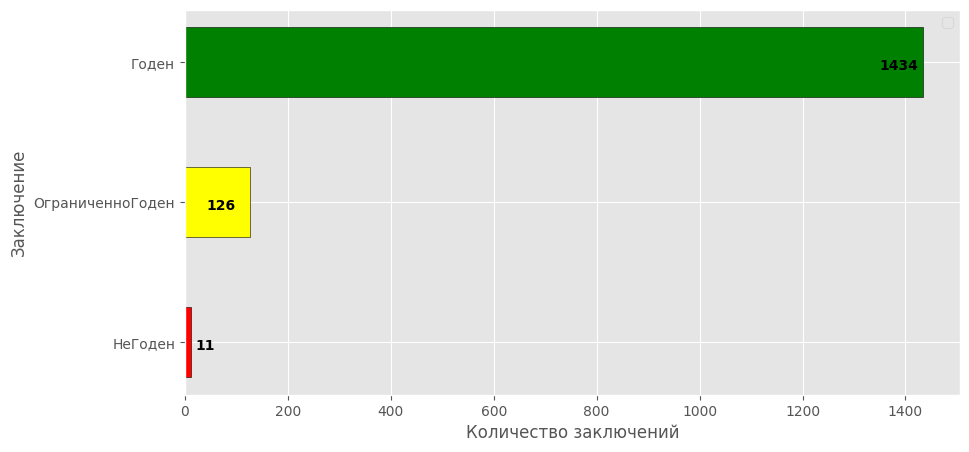

In [ ]:
# Графическое представление разбалансировки:

y_axes = list(df_one['ЗаключениеМК'].value_counts().index.values)
x_axes = df_one['ЗаключениеМК'].value_counts().values
colors = ['green', 'yellow', 'r']
plt.figure(figsize = (10, 5))
plt.style.use('ggplot')
plt.barh(y_axes, x_axes, height=0.5, color=colors, edgecolor='black', linewidth=0.4)
for i, v in enumerate(x_axes):
    plt.text(v-85 if v>=90 else v+10, i + 0.05, str(v), color='black', fontweight='bold')
plt.gca().invert_yaxis()
plt.xlabel('Количество заключений')
plt.ylabel('Заключение')
plt.legend()
plt.show()

In [ ]:
# Составим список учитываемых колонок
cols_list = df_one.columns.tolist()
selected_col = ['Клиент','КлиентДатаРождения','ДатаЗавершенияМедосмотра','КлиентПол','Цех','Профессия','ЗаключениеМК',
           'ВредныеФакторы']
# Добавим некоторые колонки по условию
for elem in cols_list:
    if 'МКБ' in elem :                  # Колонки с кодами МКБ и Детализация
        selected_col.append(elem)
        continue
    if 'Диагноз' in elem and 'Представление' in elem:     # Диагнозы
        if 'Значение' in elem:
            continue
        selected_col.append(elem)
        continue

print(f'Отобрано {len(selected_col)} колонок')

df_one = df_one[selected_col]
df_one.shape

Отобрано 190 колонок


In [ ]:
# отберем колонки с МКБ и Диагнозами в отдельные списки для дальнейщей обработки
col_mkb = []
col_dz = []
for col in selected_col:
    if 'МКБ' in col:
        col_mkb.append(col)
    elif 'Диагноз' in col:
        col_dz.append(col)
print(f'Отобрано колонок МКБ - {len(col_mkb)}, колонок с диагнозами - {len(col_dz)}')

Отобрано колонок МКБ - 91, колонок с диагнозами - 91


In [ ]:
# Дозаполним отобранные колонки самыми распространенными значениями
df_one[col_dz] = df_one[col_dz].fillna('Общий медицинский осмотр')
df_one[col_mkb] = df_one[col_mkb].fillna('Z00.0')
df_one['Цех'] = df_one['Цех'].fillna('Без отдела')

In [ ]:
df_one = concate_col(df_one,col_mkb,8,'МКБ')
df_one = concate_col(df_one,col_dz,9,'Диагнозы')

In [ ]:
# Заменим колонку "КлиентДатаРождения" на колонку возраст "AGE" в формате под AHE
col_bsd = df_one.columns.get_loc('КлиентДатаРождения')
col_dt = df_one.columns.get_loc('ДатаЗавершенияМедосмотра')
df_one = set_age (df_one,col_bsd,col_dt)

In [ ]:
df_one.head()

,Клиент,AGE,ДатаЗавершенияМедосмотра,КлиентПол,Цех,Профессия,ЗаключениеМК,ВредныеФакторы,МКБ,Диагнозы,...,Психиатрия3_МКБ101,Психиатрия3_ДиагнозПредставление1,Психиатрия3_МКБ102,Психиатрия3_ДиагнозПредставление2,Психиатрия4_МКБ101,Психиатрия4_ДиагнозПредставление1,Психиатрия4_МКБ102,Психиатрия4_ДиагнозПредставление2,Оториноларингология3_МКБ101,Оториноларингология3_ДиагнозПредставление1
0,c91e3407-b81f-11e9-80cf-0cc47aab8067,4,2022-01-25,Женский,Нет_данных,Ведущий специалист по организации обуения,Годен,11.4,Z00.0,Общий медицинский осмотр,...,Z00.0,Общий медицинский осмотр,Z00.0,Общий медицинский осмотр,Z00.0,Общий медицинский осмотр,Z00.0,Общий медицинский осмотр,Z00.0,Общий медицинский осмотр
1,1a1a5fea-8b7f-11eb-80e8-0cc47aab8067,3,2022-02-02,Мужской,Нет_данных,Ведущий специалист,Годен,4.2.5,Z00.0 I11.9,Общий медицинский осмотр Гипертензивная [гипер...,...,Z00.0,Общий медицинский осмотр,Z00.0,Общий медицинский осмотр,Z00.0,Общий медицинский осмотр,Z00.0,Общий медицинский осмотр,Z00.0,Общий медицинский осмотр
2,7fe324e0-fa51-11eb-80f6-0cc47aab8067,3,2022-02-15,Мужской,Нет_данных,Главный менеджер,ОграниченноГоден,4.2.5,Z00.0 H52.1,Общий медицинский осмотр Миопия,...,Z00.0,Общий медицинский осмотр,Z00.0,Общий медицинский осмотр,Z00.0,Общий медицинский осмотр,Z00.0,Общий медицинский осмотр,Z00.0,Общий медицинский осмотр
3,98f9d761-8d65-11ec-80fe-0cc47aab8067,2,2022-02-16,Мужской,Отдел техники и технологии строительства скважин,Главный специалист,Годен,11.1,Z00.0,Общий медицинский осмотр,...,Z00.0,Общий медицинский осмотр,Z00.0,Общий медицинский осмотр,Z00.0,Общий медицинский осмотр,Z00.0,Общий медицинский осмотр,Z00.0,Общий медицинский осмотр
4,009aac7d-7bcf-11eb-80e8-0cc47aab8067,3,2022-02-22,Мужской,Отдел технологий текущего и капитального ремон...,Старший специалист,ОграниченноГоден,11.1,Z00.0 H52.2,Общий медицинский осмотр Астигматизм,...,Z00.0,Общий медицинский осмотр,Z00.0,Общий медицинский осмотр,Z00.0,Общий медицинский осмотр,Z00.0,Общий медицинский осмотр,Z00.0,Общий медицинский осмотр


In [ ]:
df_one = df_one[['Клиент', 'AGE', 'КлиентПол', 'Цех', 'Профессия', 'ЗаключениеМК', 'ВредныеФакторы', 'МКБ', 'Диагнозы']]

In [ ]:
df_one

,Клиент,AGE,КлиентПол,Цех,Профессия,ЗаключениеМК,ВредныеФакторы,МКБ,Диагнозы
0,c91e3407-b81f-11e9-80cf-0cc47aab8067,4,Женский,Нет_данных,Ведущий специалист по организации обуения,Годен,11.4,Z00.0,Общий медицинский осмотр
1,1a1a5fea-8b7f-11eb-80e8-0cc47aab8067,3,Мужской,Нет_данных,Ведущий специалист,Годен,4.2.5,Z00.0 I11.9,Общий медицинский осмотр Гипертензивная [гипер...
2,7fe324e0-fa51-11eb-80f6-0cc47aab8067,3,Мужской,Нет_данных,Главный менеджер,ОграниченноГоден,4.2.5,Z00.0 H52.1,Общий медицинский осмотр Миопия
3,98f9d761-8d65-11ec-80fe-0cc47aab8067,2,Мужской,Отдел техники и технологии строительства скважин,Главный специалист,Годен,11.1,Z00.0,Общий медицинский осмотр
4,009aac7d-7bcf-11eb-80e8-0cc47aab8067,3,Мужской,Отдел технологий текущего и капитального ремон...,Старший специалист,ОграниченноГоден,11.1,Z00.0 H52.2,Общий медицинский осмотр Астигматизм
...,...,...,...,...,...,...,...,...,...
1961,d334f0e5-2ff4-11ec-80f9-0cc47aab8067,2,Мужской,Отдел диагностики,Инженер,Годен,"4.4,4.5,6.1",Z00.0,Общий медицинский осмотр
1962,e00ba1a0-2ff4-11ec-80f9-0cc47aab8067,2,Мужской,Элетротехническая лаборатория,Начальник лаборатории,Годен,4.4,Z00.0,Общий медицинский осмотр
1972,90fa4fca-2495-11e9-80ce-0cc47aab8067,3,Мужской,Нет_данных,"Инженер по бурению 1 категории, непосредственн...",Годен,3.1.8.2,Z00.0,Общий медицинский осмотр
1973,febbe86c-5f5b-11ea-80dc-0cc47aab8067,2,Мужской,Нет_данных,Приемщик вагонов в депо,Годен,"4.2.5,6.1",Z00.0,Общий медицинский осмотр


In [ ]:
# Уберем самые распространенные значения где это возможно
val_mkb = 'Z00.0 '
val_dz = 'Общий медицинский осмотр '
col_mkb = df_one.columns.get_loc('МКБ')
col_dz = df_one.columns.get_loc('Диагнозы')
df_one = clear_col(df_one, col_mkb, val_mkb)
df_one = clear_col(df_one, col_dz, val_dz)

In [ ]:
df_one

,Клиент,AGE,КлиентПол,Цех,Профессия,ЗаключениеМК,ВредныеФакторы,МКБ,Диагнозы
0,c91e3407-b81f-11e9-80cf-0cc47aab8067,4,Женский,Нет_данных,Ведущий специалист по организации обуения,Годен,11.4,Z00.0,Общий медицинский осмотр
1,1a1a5fea-8b7f-11eb-80e8-0cc47aab8067,3,Мужской,Нет_данных,Ведущий специалист,Годен,4.2.5,I11.9,Гипертензивная [гипертоническая] болезнь с пре...
2,7fe324e0-fa51-11eb-80f6-0cc47aab8067,3,Мужской,Нет_данных,Главный менеджер,ОграниченноГоден,4.2.5,H52.1,Миопия
3,98f9d761-8d65-11ec-80fe-0cc47aab8067,2,Мужской,Отдел техники и технологии строительства скважин,Главный специалист,Годен,11.1,Z00.0,Общий медицинский осмотр
4,009aac7d-7bcf-11eb-80e8-0cc47aab8067,3,Мужской,Отдел технологий текущего и капитального ремон...,Старший специалист,ОграниченноГоден,11.1,H52.2,Астигматизм
...,...,...,...,...,...,...,...,...,...
1961,d334f0e5-2ff4-11ec-80f9-0cc47aab8067,2,Мужской,Отдел диагностики,Инженер,Годен,"4.4,4.5,6.1",Z00.0,Общий медицинский осмотр
1962,e00ba1a0-2ff4-11ec-80f9-0cc47aab8067,2,Мужской,Элетротехническая лаборатория,Начальник лаборатории,Годен,4.4,Z00.0,Общий медицинский осмотр
1972,90fa4fca-2495-11e9-80ce-0cc47aab8067,3,Мужской,Нет_данных,"Инженер по бурению 1 категории, непосредственн...",Годен,3.1.8.2,Z00.0,Общий медицинский осмотр
1973,febbe86c-5f5b-11ea-80dc-0cc47aab8067,2,Мужской,Нет_данных,Приемщик вагонов в депо,Годен,"4.2.5,6.1",Z00.0,Общий медицинский осмотр


In [ ]:
df_one.shape

(1571, 9)

In [ ]:
df_one.to_csv('/content/drive/MyDrive/profpatolog/df_one.csv', index=False)

# Второй датасет (17 файлов)

In [ ]:
# Создадим список датафреймов и загрузим в него наши датасеты
df = list()
for name in os.listdir('/content/drive/MyDrive/profpatolog/New_dataset'):
    name = '/content/drive/MyDrive/profpatolog/New_dataset/'+name
    tmp_df = pd.read_csv(name,sep=';',header=None, nrows=5)
    tmp_shape = tmp_df.shape[1]
    if tmp_df.iloc[0,0] == 'ДокументПрохождениеМедосмотра':
        df.append(pd.read_csv(name,sep=';'))
    else:
        df.append(pd.read_csv(name,sep=';',header=None, usecols=[i for i in range(tmp_shape)]))

len(df)

<ipython-input-103-5eaa146d6d6f>:10: DtypeWarning: Columns (54,80,81,82,83,84,85,98,99,100,101,102,103,106,107,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295) have mixed types. Specify dtype option on import or set low_memory=False.
  df.append(pd.read_csv(name,sep=';',header=None, usecols=[i for i in range(tmp_shape)]))
<ipython-input-103-5

17

In [ ]:
# Для начала удалим строки где нет заключения
for i in range(len(df)):
    df[i] = clear_df (df[i])


Обрабатывается датафрейм размерностью (1502, 430), не заполнено: 447 ячеек
Новая размерность: (1055, 430)
Обрабатывается датафрейм размерностью (1041, 190), не заполнено: 792 ячеек
Новая размерность: (249, 190)
Обрабатывается датафрейм размерностью (1434, 294), не заполнено: 997 ячеек
Новая размерность: (437, 294)
Обрабатывается датафрейм размерностью (1850, 306), не заполнено: 852 ячеек
Новая размерность: (998, 306)
Обрабатывается датафрейм размерностью (1363, 290), не заполнено: 247 ячеек
Новая размерность: (1116, 290)
Обрабатывается датафрейм размерностью (1421, 266), не заполнено: 680 ячеек
Новая размерность: (741, 266)
Обрабатывается датафрейм размерностью (2533, 296), не заполнено: 1502 ячеек
Новая размерность: (1031, 296)
Обрабатывается датафрейм размерностью (1891, 458), не заполнено: 287 ячеек
Новая размерность: (1604, 458)
Обрабатывается датафрейм размерностью (1070, 218), не заполнено: 504 ячеек
Новая размерность: (566, 218)
Обрабатывается датафрейм размерностью (1832, 262),

In [ ]:
#Удалим колонки не имеющие записей
for i in range(len(df)):
    print(f'Размер до - {df[i].shape}')
    df[i] = df[i].dropna(axis=1, how='all')
    print(f'Размер после - {df[i].shape}')

Размер до - (1055, 430)
Размер после - (1055, 421)
Размер до - (249, 190)
Размер после - (249, 154)
Размер до - (437, 294)
Размер после - (437, 274)
Размер до - (998, 306)
Размер после - (998, 296)
Размер до - (1116, 290)
Размер после - (1116, 290)
Размер до - (741, 266)
Размер после - (741, 246)
Размер до - (1031, 296)
Размер после - (1031, 290)
Размер до - (1604, 458)
Размер после - (1604, 444)
Размер до - (566, 218)
Размер после - (566, 206)
Размер до - (1054, 262)
Размер после - (1054, 260)
Размер до - (1191, 342)
Размер после - (1191, 326)
Размер до - (1247, 446)
Размер после - (1247, 426)
Размер до - (1187, 304)
Размер после - (1187, 294)
Размер до - (763, 228)
Размер после - (763, 210)
Размер до - (1088, 258)
Размер после - (1088, 254)
Размер до - (471, 222)
Размер после - (471, 220)
Размер до - (1416, 310)
Размер после - (1416, 308)


In [ ]:
# Проверим заполненность колонки с датой рождения и датой прохождения осмотра (нужно для вычисления возраста)
for i in range(len(df)):
    cols = df[i].columns.tolist()
    print(f'Датафрейм {i+1} Колонка дата родения - Заполнено: {df[i][cols[2]].count()} ячеек из {df[i].shape[0]} или {round(df[i][cols[2]].count()*100/df[i].shape[0],2)}%')
    print(f'Датафрейм {i+1} Колонка дата медосмотра - Заполнено: {df[i][cols[5]].count()} ячеек из {df[i].shape[0]} или {round(df[i][cols[5]].count()*100/df[i].shape[0],2)}%')
    print('--------')

Датафрейм 1 Колонка дата родения - Заполнено: 1054 ячеек из 1055 или 99.91%
Датафрейм 1 Колонка дата медосмотра - Заполнено: 1055 ячеек из 1055 или 100.0%
--------
Датафрейм 2 Колонка дата родения - Заполнено: 249 ячеек из 249 или 100.0%
Датафрейм 2 Колонка дата медосмотра - Заполнено: 249 ячеек из 249 или 100.0%
--------
Датафрейм 3 Колонка дата родения - Заполнено: 437 ячеек из 437 или 100.0%
Датафрейм 3 Колонка дата медосмотра - Заполнено: 437 ячеек из 437 или 100.0%
--------
Датафрейм 4 Колонка дата родения - Заполнено: 996 ячеек из 998 или 99.8%
Датафрейм 4 Колонка дата медосмотра - Заполнено: 998 ячеек из 998 или 100.0%
--------
Датафрейм 5 Колонка дата родения - Заполнено: 1116 ячеек из 1116 или 100.0%
Датафрейм 5 Колонка дата медосмотра - Заполнено: 1116 ячеек из 1116 или 100.0%
--------
Датафрейм 6 Колонка дата родения - Заполнено: 740 ячеек из 741 или 99.87%
Датафрейм 6 Колонка дата медосмотра - Заполнено: 741 ячеек из 741 или 100.0%
--------
Датафрейм 7 Колонка дата родения 

In [ ]:
# Дозаполним незаполненные даты датой '1988-01-01T00:00:00' т.е. нарисуем им по 35 лет
for i in range(len(df)):
    cols = df[i].columns.tolist()
    df[i][cols[2]] = df[i][cols[2]].fillna('1988-01-01T00:00:00')


In [ ]:
# Введем на место колонки "ДатаРождения" колонку "AGE" содержащую возраст в кодированном виде
for i in range(len(df)):
    df[i] = set_age (df[i],2,5)

In [ ]:
# Приведение к 3 классам методом replace()
for i in range(len(df)):
    cols = df[i].columns.tolist()
    new_val = {'ГоденСКоррекциейСлуха':'ОграниченноГоден','ГоденСКоррекциейЗрения':'ОграниченноГоден','ГоденБезРаботНаВысотах':'ОграниченноГоден','НуждаетсяВДообследованииИЛечении':'НеГоден','ВременноНегоден':'НеГоден','Негоден':'НеГоден'}
    df[i][cols[12]] = df[i][cols[12]].replace(new_val)
    info_col(12,df[i])
    print('------------')

Заполнено: 1055 ячеек (100.0%), уникальных записей: 3
Годен               1001
ОграниченноГоден      47
НеГоден                7
Name: 12, dtype: int64
Тип данных:  object
------------
Заполнено: 249 ячеек (100.0%), уникальных записей: 3
Годен               233
ОграниченноГоден     12
НеГоден               4
Name: ЗаключениеМК, dtype: int64
Тип данных:  object
------------
Заполнено: 437 ячеек (100.0%), уникальных записей: 3
Годен               416
ОграниченноГоден     20
НеГоден               1
Name: 12, dtype: int64
Тип данных:  object
------------
Заполнено: 998 ячеек (100.0%), уникальных записей: 3
Годен               937
ОграниченноГоден     59
НеГоден               2
Name: 12, dtype: int64
Тип данных:  object
------------
Заполнено: 1116 ячеек (100.0%), уникальных записей: 3
Годен               1027
ОграниченноГоден      79
НеГоден               10
Name: 12, dtype: int64
Тип данных:  object
------------
Заполнено: 741 ячеек (100.0%), уникальных записей: 3
Годен               696


In [ ]:
# Перебор всех датафреймов, сокращение до отобранных колонок
for dfs in range(len(df)):
    cols = df[dfs].columns.tolist()
    mkb = list()
    mkb_dz = list()
    diagnoz = list()
    diagnoz_dz = list()
#    klass = list()
    match_all = list()
    for col in range(16,len(cols)):
        tmp_data = df[dfs][cols[col]].unique()
        for n in range(tmp_data.shape[0]):
            if tmp_data[n] == 'Z00.0':      # Колонка с данными МКБ
                df[dfs][cols[col]] = df[dfs][cols[col]].fillna('Z00.0')
                mkb.append(df[dfs][cols[col]].to_list())
                continue
            elif tmp_data[n] == 'Общий медицинский осмотр':         # Колонка с Диагнозами
                df[dfs][cols[col]] = df[dfs][cols[col]].fillna('Общий медицинский осмотр')
                diagnoz.append(df[dfs][cols[col]].to_list())
                continue
            elif tmp_data[n] == '[Z00.0] Общий медицинский осмотр\r\n':     # Колонка  Диагноз_Значение
                df[dfs][cols[col]] = df[dfs][cols[col]].fillna('[Z00.0] Общий медицинский осмотр')      # Незаполненные ячейки заполним комбинированным значением "[Z99.9] Без диагноза"
                match_all.append(df[dfs][cols[col]].to_list())
                continue
    mkb_all = list()
    for k in range(len(mkb[0])):
        mkb_all.append('')
        for i in range(len(mkb)):
            if mkb[i][k] not in mkb_all[k]:
                if mkb_all[k] == '':
                    mkb_all[k] = mkb[i][k]
                else:
                    mkb_all[k] += ' ' + mkb[i][k]

    for k in range(len(diagnoz[0])):
        for i in range(1,len(diagnoz)):
            if diagnoz[i][k] not in diagnoz[0][k]:
                diagnoz[0][k] += ' ' + diagnoz[i][k]

    diagnoz_all = diagnoz[0]

    for k in range(len(match_all)):
        for i in range(len(match_all[k])):
            match_tmp = re.findall(r'\[([A-Z]\d\d\.\d)\] (.+)\r\n(?:Классификация: (.*)\r\n)*(?:Описание: (.*)\r\n)*', match_all[k][i])
            for m in range(len(match_tmp)):
                if len(match_tmp[m][0]) > 0:
                    if match_tmp[m][0] not in mkb_all[i]:
                        mkb_all[i] += ' ' + match_tmp[m][0]
                if len(match_tmp[m][3]) > 0:
                    if match_tmp[m][3] not in diagnoz_all[i]:
                        diagnoz_all[i] += ' ' + match_tmp[m][3]
                if len(match_tmp[m][1]) > 0:
                    if match_tmp[m][1] not in diagnoz_all[i]:
                        diagnoz_all[i] += ' ' + match_tmp[m][1]

    df[dfs].insert(16,'МКБ',mkb_all)
    df[dfs].insert(17,'Диагнозы',diagnoz_all)
    df[dfs] = df[dfs].iloc[:,[1,2,3,10,11,12,15,16,17]]

<ipython-input-110-7d6a690941e8>:56: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[dfs].insert(16,'МКБ',mkb_all)
<ipython-input-110-7d6a690941e8>:57: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[dfs].insert(17,'Диагнозы',diagnoz_all)
<ipython-input-110-7d6a690941e8>:56: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newf

In [ ]:
df[1]

,Клиент,AGE,КлиентПол,Цех,Профессия,ЗаключениеМК,ВредныеФакторы,МКБ,Диагнозы
0,2264f308-b78c-11ea-80dd-0cc47aab8067,4,Мужской,NaN,Водитель-экспедитор,Годен,"18.2,23,4.3.2,5.1,1.50",Z00.0,Общий медицинский осмотр
1,b1ebfc4c-a367-11ec-80ff-0cc47aab8067,3,Мужской,NaN,Водитель автомобиля,Годен,"23,18.2,4.3.2,5.1,1.50",Z00.0,Общий медицинский осмотр
2,28b3b8f4-c23c-11ec-8100-0cc47aab8067,4,Мужской,NaN,Водитель автомобиля,Годен,"23,18.2,4.3.2,5.1,1.50",Z00.0,Общий медицинский осмотр
3,300cb78c-da36-11eb-80f6-0cc47aab8067,3,Мужской,NaN,Водитель автомобиля,Годен,"23,18.2,4.3.2,1.50,5.1",Z00.0,Общий медицинский осмотр
4,5755a71d-db14-11ec-8100-0cc47aab8067,2,Мужской,NaN,Водитель автомобиля,Годен,"23,18.2,4.3.2,5.1,1.50",Z00.0,Общий медицинский осмотр
...,...,...,...,...,...,...,...,...,...
870,e4304436-5fc1-11e6-82d2-448a5b8e76ba,2,Мужской,NaN,Водитель автомобиля,Годен,"1.50,4.3.2,5.1,18.2,23",Z00.0,Общий медицинский осмотр
871,11ff5f28-e7b4-11ec-8102-0cc47aab8067,1,Мужской,NaN,Водитель автомобиля,Годен,"23,18.2,4.3.2,5.1,1.50",Z00.0,Общий медицинский осмотр
872,249ab770-af87-11e9-80cf-0cc47aab8067,3,Мужской,NaN,Водитель автомобиля,Годен,"1.50,4.3.2,5.1,18.2,23",Z00.0,Общий медицинский осмотр
873,8b1ab91d-0b71-11ee-8133-0cc47aab8067,3,Мужской,NaN,Водитель автомобиля,Годен,"1.50,4.3.2,5.1,18.2,23",Z00.0,Общий медицинский осмотр


In [ ]:
colls_name = df[1].columns.tolist()
for dfs in range(len(df)):
    df[dfs].columns = colls_name
df[0]

,Клиент,AGE,КлиентПол,Цех,Профессия,ЗаключениеМК,ВредныеФакторы,МКБ,Диагнозы
0,e1bac74a-a979-11eb-80f3-0cc47aab8067,6,Женский,NaN,Уборщик производственных помещений 2 разряда,Годен,23,Z00.0 N95.2,Общий медицинский осмотр постменопаузальный ат...
1,e1bac76c-a979-11eb-80f3-0cc47aab8067,4,Женский,NaN,Оператор расфасовочно-упаковочного автомата 4 ...,Годен,23,Z00.0 I11.9 N95.1,Общий медицинский осмотр Гипертензивная [гипер...
2,dbbc41d3-a979-11eb-80f3-0cc47aab8067,5,Мужской,NaN,Водитель автомобиля 4 разряда,Годен,"18.1,23",Z00.0 H52.0,Общий медицинский осмотр Гиперметропия Гиперме...
3,8e5dc39c-fcc4-11e7-80e0-708bcd7f83cd,7,Женский,NaN,Оператор расфасовочно-упаковочного автомата 4 ...,Годен,23,Z00.0 I25.2 N95.2,Общий медицинский осмотр Перенесенный в прошло...
4,dbbc41b8-a979-11eb-80f3-0cc47aab8067,6,Женский,NaN,Продавец продовольственных товаров 4 разряда,Годен,23,Z00.0,Общий медицинский осмотр
...,...,...,...,...,...,...,...,...,...
1480,c033d8c1-cd5b-11ed-811f-0cc47aab8067,3,Мужской,Отдел газодинамических и газоконденсатных иссл...,Оператор по исследованию скважин,Годен,"1.30.1,4.2.5,4.3.1,4.3.2,4.4,4.7,5.1,6.2,11.1,...",Z00.0 K29.5,Общий медицинский осмотр Хронический гастрит н...
1498,64d7912f-81e8-11ed-810a-0cc47aab8067,5,Мужской,NaN,Монтажник технологических трубопроводов,НеГоден,"4.4,5.1,6.1,11.4,15",Z00.0 H52.0 K26.9 K29.5 R73.9,Общий медицинский осмотр Гиперметропия Язва дв...
1499,5caad57b-ca02-11ed-8116-0cc47aab8067,5,Женский,Ооо «территория еды 102»,Повар,Годен,23,Z00.0 I11.9 N95.2,Общий медицинский осмотр Гипертензивная [гипер...
1500,8308e856-71df-11ec-80fc-0cc47aab8067,3,Женский,025-Уфа,Работник торгового зала - укладчик,Годен,"18.1,23",Z00.0,Общий медицинский осмотр <>


In [ ]:
# Уберем самые распространенные значения где это возможно
val_mkb = 'Z00.0 '
val_dz = 'Общий медицинский осмотр '
col_mkb = df[0].columns.get_loc('МКБ')
col_dz = df[0].columns.get_loc('Диагнозы')

for i in range(len(df)):
    df[i] = clear_col(df[i], col_mkb, val_mkb)
    df[i] = clear_col(df[i], col_dz, val_dz)


In [ ]:
df[0]

,Клиент,AGE,КлиентПол,Цех,Профессия,ЗаключениеМК,ВредныеФакторы,МКБ,Диагнозы
0,e1bac74a-a979-11eb-80f3-0cc47aab8067,6,Женский,NaN,Уборщик производственных помещений 2 разряда,Годен,23,N95.2,постменопаузальный атрофический кольпит
1,e1bac76c-a979-11eb-80f3-0cc47aab8067,4,Женский,NaN,Оператор расфасовочно-упаковочного автомата 4 ...,Годен,23,I11.9 N95.1,Гипертензивная [гипертоническая] болезнь с пре...
2,dbbc41d3-a979-11eb-80f3-0cc47aab8067,5,Мужской,NaN,Водитель автомобиля 4 разряда,Годен,"18.1,23",H52.0,Гиперметропия Гиперметропия лабой степени обои...
3,8e5dc39c-fcc4-11e7-80e0-708bcd7f83cd,7,Женский,NaN,Оператор расфасовочно-упаковочного автомата 4 ...,Годен,23,I25.2 N95.2,Перенесенный в прошлом инфаркт миокарда Постме...
4,dbbc41b8-a979-11eb-80f3-0cc47aab8067,6,Женский,NaN,Продавец продовольственных товаров 4 разряда,Годен,23,Z00.0,Общий медицинский осмотр
...,...,...,...,...,...,...,...,...,...
1480,c033d8c1-cd5b-11ed-811f-0cc47aab8067,3,Мужской,Отдел газодинамических и газоконденсатных иссл...,Оператор по исследованию скважин,Годен,"1.30.1,4.2.5,4.3.1,4.3.2,4.4,4.7,5.1,6.2,11.1,...",K29.5,Хронический гастрит неуточненный <>
1498,64d7912f-81e8-11ed-810a-0cc47aab8067,5,Мужской,NaN,Монтажник технологических трубопроводов,НеГоден,"4.4,5.1,6.1,11.4,15",H52.0 K26.9 K29.5 R73.9,Гиперметропия Язва двенадцатиперстной кишки не...
1499,5caad57b-ca02-11ed-8116-0cc47aab8067,5,Женский,Ооо «территория еды 102»,Повар,Годен,23,I11.9 N95.2,Гипертензивная [гипертоническая] болезнь с пре...
1500,8308e856-71df-11ec-80fc-0cc47aab8067,3,Женский,025-Уфа,Работник торгового зала - укладчик,Годен,"18.1,23",Z00.0,Общий медицинский осмотр <>


In [ ]:
# Соберем общий датасет из того что получилось
df_two = pd.concat(df)
print(df_two.shape)

(16214, 9)


In [ ]:
df_two['ЗаключениеМК'].value_counts()

Годен               15125
ОграниченноГоден      984
НеГоден               105
Name: ЗаключениеМК, dtype: int64

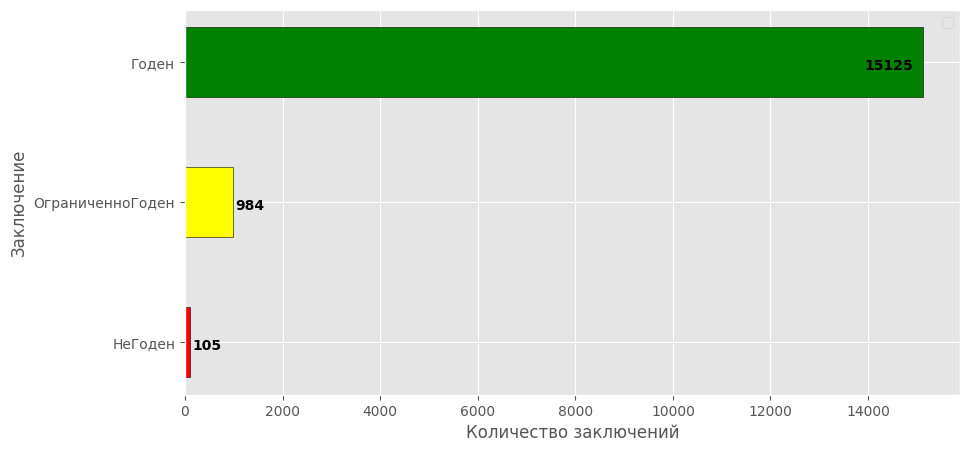

In [ ]:
# Графическое представление разбалансировки:

y_axes = list(df_two['ЗаключениеМК'].value_counts().index.values)
x_axes = df_two['ЗаключениеМК'].value_counts().values
colors = ['green', 'yellow', 'r']
plt.figure(figsize = (10, 5))
plt.style.use('ggplot')
plt.barh(y_axes, x_axes, height=0.5, color=colors, edgecolor='black', linewidth=0.4)
for i, v in enumerate(x_axes):
    plt.text(v-1200 if v>=2000 else v+40, i + 0.05, str(v), color='black', fontweight='bold')
plt.gca().invert_yaxis()
plt.xlabel('Количество заключений')
plt.ylabel('Заключение')
plt.legend()
plt.show()

In [ ]:
df_two.count()

Клиент            16214
AGE               16214
КлиентПол         16214
Цех               16214
Профессия         16214
ЗаключениеМК      16214
ВредныеФакторы    16214
МКБ               16214
Диагнозы          16214
dtype: int64

In [ ]:
# Дозаполним ячейки
df_two['КлиентПол'] = df_two['КлиентПол'].fillna('Мужской')
df_two['Цех'] = df_two['Цех'].fillna('Без отдела')
df_two['ВредныеФакторы'] = df_two['ВредныеФакторы'].fillna('23')

In [ ]:
df_two.to_csv('/content/drive/MyDrive/profpatolog/df_two.csv', index=False)

# Третий датасет "Весь период"

In [ ]:
df_new = pd.read_csv('/content/drive/MyDrive/profpatolog/Весь период.csv', sep=';')

<ipython-input-158-bc1acf122085>:1: DtypeWarning: Columns (16,18,19,20,22,23,25,26,27,29,30,32,35,36,37,39,40,41,42,43,44,46,47,49,50,52,53,54,55,56,57,58,59,60,61,62,63,64,66,68,70,74,75,77,78,80,81,82,84,85,87,90,91,92,95,96,97,99,100,101,103,104,108,109,114,115,116,120,122,123,124,126,127,128,130,131,133,138,139,142,143,145,146,148,149,153,154,155,157,158,160,161,162,164,165,167,168,170,171,173,175,176,177,178,179,180,181,182,183,184,188,189,191,192,194,195,196,201,202,204,208,209,210,211,214,215,216,217,218,220,221,222,224,225,228,229,230,231,233,234,235,236,240,241,242,243,244,245,246,247,248,250,258,260,262,265,266,269,270,272,273,274,276,277,278,280,281,282,283,284,285,286,287,288) have mixed types. Specify dtype option on import or set low_memory=False.
  df_new = pd.read_csv('/content/drive/MyDrive/profpatolog/Весь период.csv', sep=';')


In [ ]:
df_new['ЗаключениеМК'].value_counts()

Годен                               17982
ГоденСКоррекциейЗрения               1114
ГоденБезРаботНаВысотах                 52
НуждаетсяВДообследованииИЛечении       40
ГоденСКоррекциейСлуха                   5
ОграниченноГоден                        4
Негоден                                 3
Газоспасатель                           2
 п. 11.3                                1
машинист бульдозера                     1
 Газоспасатель                          1
Name: ЗаключениеМК, dtype: int64

In [ ]:
#Удалим строки с ошибками заполнения ('машинист бульдозера', 'Газоспасатель',' Газоспасатель')
count_ind = df_new.shape[0]
for str1 in ('машинист бульдозера', 'Газоспасатель',' Газоспасатель',' п. 11.3'):
    df_new = df_new.drop(df_new[df_new['ЗаключениеМК'] == str1].index)
print(f'Удалено {count_ind - df_new.shape[0]} строк(и)')
df_new.shape

Удалено 5 строк(и)


(32681, 289)

In [ ]:
# Проверим заполнение колонок с диагнозами
sel_col = []
for col in df_new.columns:
    if 'Диагноз' in col:
        sel_col.append(col)

df_new[sel_col].count()

Гинекология1_Диагноз_ЗначениеПредставлениеПредставление       0
Гинекология2_Диагноз_ЗначениеПредставлениеПредставление       0
Гинекология3_Диагноз_ЗначениеПредставлениеПредставление       0
Гинекология4_Диагноз_ЗначениеПредставлениеПредставление       0
ГинекологНеИсп1_Диагноз_ЗначениеПредставлениеПредставление    0
                                                             ..
Хирургия3_Диагноз_ЗначениеПредставлениеПредставление          0
Хирургия4_Диагноз_ЗначениеПредставлениеПредставление          0
ХирургНеИсп1_Диагноз_ЗначениеПредставлениеПредставление       0
ХирургНеИсп2_Диагноз_ЗначениеПредставлениеПредставление       0
ХирургНеИсп3_Диагноз_ЗначениеПредставлениеПредставление       0
Length: 63, dtype: int64

Колонки с диагнозами не заполненны, для совместимости с предыдущими датасетами будем дополнять "стандартными значениями"

In [ ]:
# Исправим ошибки заполнения колонки "ВредныеФакторы" (15-й) индекс
new_val = {'янв':'1','фев':'2','мар':'3','апр':'4','май':'5','июн':'6','июл':'7','авг':'8','сен':'9','окт':'10','ноя':'11','дек':'12','2002':'2','2003':'3','2004':'4','2005':'5','01':'1','02':'2','03':'3','04':'4','05':'5','06':'6','07':'7','08':'8','09':'9'}
for i in range(df_new.shape[0]):
    for key in new_val.keys():
        val = str(df_new.iloc[i,15])
        if val.find(key) != -1:
            val = val.replace(key,new_val[key])
            df_new.iloc[i,15] = val

In [ ]:
# Чтиобы не получить неопределенные данные выставим всем у кого нет дату рождения 01.01.1988 т.е. на 2023 год - 35 лет
df_new['КлиентДатаРождения'] = df_new['КлиентДатаРождения'].fillna('1988-01-01T00:00:00')
# Проверка:
print(f"Колонка дата родения - Заполнено: {df_new['КлиентДатаРождения'].count()} ячеек из {df_new.shape[0]} или {round(df_new['КлиентДатаРождения'].count()*100/df_new.shape[0],2)}%")

Колонка дата родения - Заполнено: 32681 ячеек из 32681 или 100.0%


In [ ]:
# Имеются ошибки заполнения года рождения(0981,1077,1905...) - исправляем
new_val = {'0969':'1969','0981':'1981','1077':'1977','1905':'2005','2022':'2002','2015':'2005','2018':'2008',}
df_new['КлиентДатаРождения'] = df_new['КлиентДатаРождения'].replace(new_val)

In [ ]:
# Заменим колонку "КлиентДатаРождения" на колонку возраст "AGE" в формате под AHE
col_bsd = df_new.columns.get_loc('КлиентДатаРождения')
col_dt = df_new.columns.get_loc('ДатаЗавершенияМедосмотра')
df_new = set_age (df_new,col_bsd,col_dt)

In [ ]:
# Отберем колонки с МКБ
col_mkb = []
for col in df_new.columns:
    if 'МКБ' in col:
        col_mkb.append(col)

print(f"Отобрано {len(sel_col)} колонок")

Отобрано 63 колонок


In [ ]:
df_new[col_mkb] = df_new[col_mkb].fillna('Z00.0')

In [ ]:
df_new = concate_col(df_new,col_mkb,16,'МКБ')

In [ ]:
df_new.insert(17,'Диагнозы','Общий медицинский осмотр')

In [ ]:
df_new = df_new[['Клиент', 'AGE', 'КлиентПол', 'Цех', 'Профессия', 'ЗаключениеМК', 'ВредныеФакторы', 'МКБ', 'Диагнозы']]

In [ ]:
df_new.shape

(32681, 9)

In [ ]:
# Удалим строки с незаполненной колонкой назначения
row = df_new.columns.get_loc('ЗаключениеМК')
df_new = clear_df(df_new,row)

Обрабатывается датафрейм размерностью (32681, 9), не заполнено: 13481 ячеек
Новая размерность: (19200, 9)


In [ ]:
# Приведение к 3 классам методом replace()
new_val = {'ГоденСКоррекциейСлуха':'ОграниченноГоден','ГоденСКоррекциейЗрения':'ОграниченноГоден','ГоденБезРаботНаВысотах':'ОграниченноГоден','НуждаетсяВДообследованииИЛечении':'НеГоден','Негоден':'НеГоден'}
df_new['ЗаключениеМК'] = df_new['ЗаключениеМК'].replace(new_val)

In [ ]:
df_new['ЗаключениеМК'].value_counts()

Годен               17982
ОграниченноГоден     1175
НеГоден                43
Name: ЗаключениеМК, dtype: int64

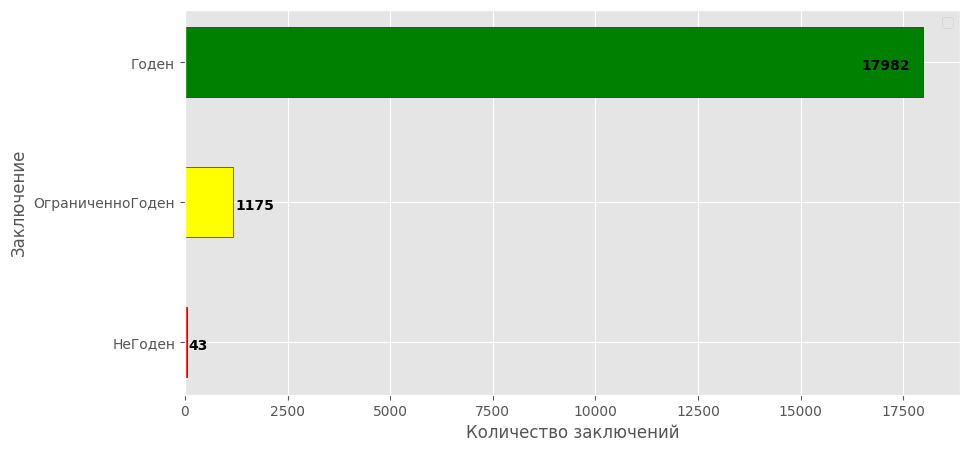

In [ ]:
# Графическое представление:

y_axes = list(df_new['ЗаключениеМК'].value_counts().index.values)
x_axes = df_new['ЗаключениеМК'].value_counts().values
colors = ['green', 'yellow', 'r']
plt.figure(figsize = (10, 5))
plt.style.use('ggplot')
plt.barh(y_axes, x_axes, height=0.5, color=colors, edgecolor='black', linewidth=0.4)
for i, v in enumerate(x_axes):
    plt.text(v-1500 if v>=2000 else v+50, i + 0.05, str(v), color='black', fontweight='bold')
plt.gca().invert_yaxis()
plt.xlabel('Количество заключений')
plt.ylabel('Заключение')
plt.legend()
plt.show()

In [ ]:
df_new.count()

Клиент            19200
AGE               19200
КлиентПол         19196
Цех                6704
Профессия         19200
ЗаключениеМК      19200
ВредныеФакторы    18485
МКБ               19200
Диагнозы          19200
dtype: int64

In [ ]:
df_new[df_new['КлиентПол'].isna()]

,Клиент,AGE,КлиентПол,Цех,Профессия,ЗаключениеМК,ВредныеФакторы,МКБ,Диагнозы
6169,5662afb8-bb55-11ec-8100-0cc47aab8067,1,NaN,NaN,Официант,Годен,26,Z00.0,Общий медицинский осмотр
25864,5662afb8-bb55-11ec-8100-0cc47aab8067,1,NaN,NaN,Официант,Годен,26,Z00.0,Общий медицинский осмотр
26607,57ca20b8-d223-11ed-8124-0cc47aab8067,2,NaN,NaN,Водитель,Годен,"11.1,11.3,11.4,18,18.1,18.2,4.3.2",Z00.0,Общий медицинский осмотр
29140,57ca20b8-d223-11ed-8124-0cc47aab8067,2,NaN,NaN,Водитель,Годен,"11.1,11.3,11.4,18,18.1,18.2,4.3.2",Z00.0,Общий медицинский осмотр


In [ ]:
# Дозаполним ячейки
df_new['КлиентПол'] = df_new['КлиентПол'].fillna('Мужской')
df_new['Цех'] = df_new['Цех'].fillna('Без отдела')
df_new['ВредныеФакторы'] = df_new['ВредныеФакторы'].fillna('23')

In [ ]:
# Уберем самые распространенные значения где это возможно
val_mkb = 'Z00.0 '
val_dz = 'Общий медицинский осмотр '
col_mkb = df_new.columns.get_loc('МКБ')
col_dz = df_new.columns.get_loc('Диагнозы')
df_new = clear_col(df_new, col_mkb, val_mkb)
df_new = clear_col(df_new, col_dz, val_dz)

In [ ]:
df_new

,Клиент,AGE,КлиентПол,Цех,Профессия,ЗаключениеМК,ВредныеФакторы,МКБ,Диагнозы
0,dca98d4e-2098-11ea-80d6-0cc47aab8067,2,Женский,Без отдела,Продавец-кассир,Годен,23,Z00.0,Общий медицинский осмотр
1,b35fb2bb-9c35-11eb-80eb-0cc47aab8067,1,Женский,Без отдела,Продавец-кассир,Годен,4.10,Z00.0,Общий медицинский осмотр
2,f8c98e39-9c2c-11eb-80eb-0cc47aab8067,0,Женский,Без отдела,Младший продавец-консультант,Годен,23,Z00.0,Общий медицинский осмотр
3,7ea364a1-9c2d-11eb-80eb-0cc47aab8067,2,Женский,Без отдела,Менеджер магазина,Годен,23,Z00.0,Общий медицинский осмотр
4,52eb6a7d-c1ab-11ea-80dd-0cc47aab8067,1,Женский,Без отдела,Продавец-кассир,Годен,23,Z00.0,Общий медицинский осмотр
...,...,...,...,...,...,...,...,...,...
32512,7db8d4db-36eb-11ec-80fa-0cc47aab8067,5,Мужской,Без отдела,Водитель автомобиля,Годен,"23,18.2,4.3.2,5.1,1.50",Z00.0,Общий медицинский осмотр
32513,27c2fffd-ea16-11eb-80f6-0cc47aab8067,2,Мужской,Без отдела,Водитель автомобиля,Годен,"1.50,4.3.2,5.1,18.2,23",Z00.0,Общий медицинский осмотр
32514,2fc16ed1-dd28-11ea-80e2-0cc47aab8067,4,Мужской,Без отдела,Водитель автомобиля,Годен,"1.50,4.3.2,5.1,18.2,23",Z00.0,Общий медицинский осмотр
32515,249ab785-af87-11e9-80cf-0cc47aab8067,3,Мужской,Без отдела,Водитель автомобиля,Годен,"1.50,4.3.2,5.1,18.2,23",Z00.0,Общий медицинский осмотр


In [ ]:
df_new.to_csv('/content/drive/MyDrive/profpatolog/df_new.csv', index=False)

# Сведение датасетов в общий

In [ ]:
# Объединение 3-х датафреймов в один
df_all = pd.concat([df_one,df_two,df_new])
df_all.shape

(36985, 9)

In [ ]:
# Проверим сколько уникальных записей в базе (по колонке "Клиент")
df_all['Клиент'].nunique()

14668

Вывод - каждый клиен может повторятся 2-3 раза, т.е. присутствует в 2 или 3 датасетах.

In [ ]:
df_all['ЗаключениеМК'].value_counts()

Годен               34541
ОграниченноГоден     2285
НеГоден               159
Name: ЗаключениеМК, dtype: int64

In [ ]:
# Попробуем удалить дубликаты используя колонки "Клиент" (колонка для этого и оставлялась) и "ЗаключениеМК"
# Как выяснилось есть несколько "клиентов" с разными "Заключениями".
df_all_2 = df_all.drop_duplicates(subset=['Клиент', 'ЗаключениеМК'])
df_all_2.shape

(14786, 9)

In [ ]:
df_all_2['ЗаключениеМК'].value_counts()

Годен               13716
ОграниченноГоден      958
НеГоден               112
Name: ЗаключениеМК, dtype: int64

In [ ]:
# Уберем "подобные данные" - строки датафрейма со сходными входными данными.
# Не учитываем колонку "профессия" из-за разношерстности заполнения даже по одной профессии
df_all_2 = df_all_2.drop_duplicates(subset=['AGE','КлиентПол', 'ЗаключениеМК','ВредныеФакторы','МКБ'])
df_all_2.shape

(8436, 9)

In [ ]:
df_all_2['ЗаключениеМК'].value_counts()

Годен               7449
ОграниченноГоден     876
НеГоден              111
Name: ЗаключениеМК, dtype: int64

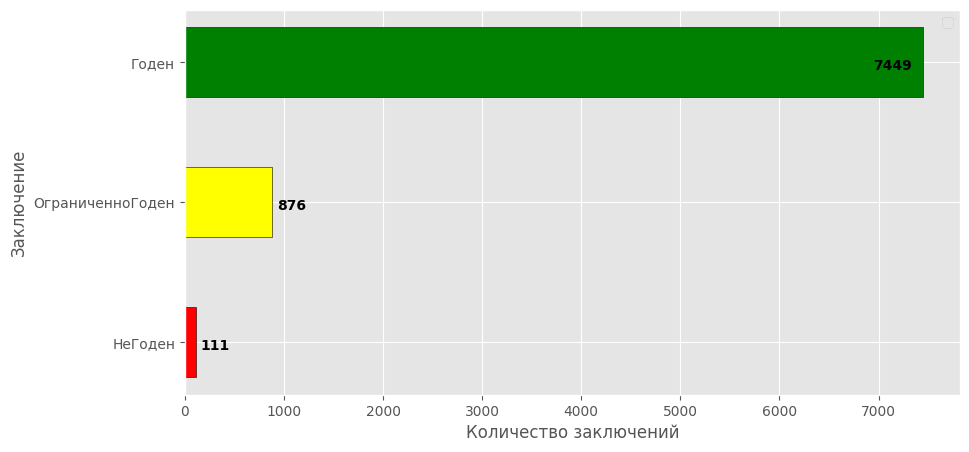

In [ ]:
# Графическое представление:

y_axes = list(df_all_2['ЗаключениеМК'].value_counts().index.values)
x_axes = df_all_2['ЗаключениеМК'].value_counts().values
colors = ['green', 'yellow', 'r']
plt.figure(figsize = (10, 5))
plt.style.use('ggplot')
plt.barh(y_axes, x_axes, height=0.5, color=colors, edgecolor='black', linewidth=0.4)
for i, v in enumerate(x_axes):
    plt.text(v-500 if v>=2000 else v+50, i + 0.05, str(v), color='black', fontweight='bold')
plt.gca().invert_yaxis()
plt.xlabel('Количество заключений')
plt.ylabel('Заключение')
plt.legend()
plt.show()

In [ ]:
df_all_2.to_csv('/content/drive/MyDrive/profpatolog/df_all_2.csv', index=False)

# Подготовка датасета для подачи в сетку

## Загрузка сохраненного ранее датасета и балансировка

In [ ]:
df_all = pd.read_csv('/content/drive/MyDrive/profpatolog/df_all_2.csv')

In [ ]:
df_all['ЗаключениеМК'].value_counts()

Годен               7449
ОграниченноГоден     876
НеГоден              111
Name: ЗаключениеМК, dtype: int64

In [ ]:
#
colid = df_all.columns.get_loc('ЗаключениеМК')
df_all = balance_data(df_all,colid,'НеГоден','Годен')
df_all = balance_data(df_all,colid,'ОграниченноГоден','Годен')

Размерность до балансировки - (8436, 9)
Размерность после балансировки - (10212, 9)
Размерность до балансировки - (10212, 9)
Размерность после балансировки - (11964, 9)


In [ ]:
df_all['ЗаключениеМК'].value_counts()

Годен               7449
ОграниченноГоден    2628
НеГоден             1887
Name: ЗаключениеМК, dtype: int64

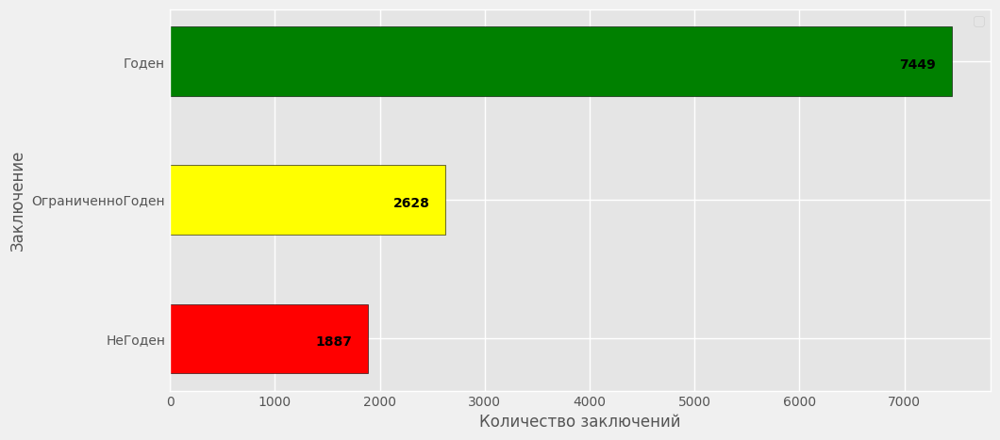

In [ ]:
# Графическое представление:

y_axes = list(df_all['ЗаключениеМК'].value_counts().index.values)
x_axes = df_all['ЗаключениеМК'].value_counts().values
colors = ['green', 'yellow', 'r']
plt.figure(figsize = (10, 5))
plt.style.use('ggplot')
plt.barh(y_axes, x_axes, height=0.5, color=colors, edgecolor='black', linewidth=0.4)
for i, v in enumerate(x_axes):
    plt.text(v-500 if v>=1000 else v+50, i + 0.05, str(v), color='black', fontweight='bold')
plt.gca().invert_yaxis()
plt.xlabel('Количество заключений')
plt.ylabel('Заключение')
plt.legend()
plt.show()

In [ ]:
df_all.count()

Клиент            11964
AGE               11964
КлиентПол         11964
Цех               11964
Профессия         11964
ЗаключениеМК      11964
ВредныеФакторы    11964
МКБ               11964
Диагнозы          11964
dtype: int64

In [ ]:
#df_all['КлиентПол'] = df_all['КлиентПол'].replace('НеУказан','Мужской')

In [ ]:
#df_all['КлиентПол'].value_counts()

## Создание токенайзеров и LabelEncoder для колонок

In [ ]:
# Колонка "ВредныеФакторы" из фильтра исключим ".", чтобы индексы сохранились правильно
words_bed = 152
tokenizer_bed = Tokenizer(num_words=words_bed, filters='i!"#$%&()*+,-–—/…:;<=>?@[\\]^_`{|}~«»\t\n\xa0\ufeff', lower=True, split=' ', oov_token='0.0.0', char_level=False)
tokenizer_bed.fit_on_texts(list(df_all['ВредныеФакторы']))
print(max(tokenizer_bed.word_index.values()))
print(tokenizer_bed.word_counts)

152
OrderedDict([('5.1', 4277), ('4.4', 3205), ('6.2', 1781), ('11.1', 3359), ('11.4', 2024), ('4.3.2', 1267), ('1.1', 656), ('1.30.1', 249), ('3.1.8.2', 63), ('1.29.2', 399), ('1.15', 144), ('1.29.1', 110), ('4.2.5', 2189), ('11', 380), ('15', 1463), ('4.7', 1639), ('4.8', 818), ('4.9', 164), ('4.10', 61), ('6.1', 2520), ('9', 1407), ('11.3', 702), ('1.50', 1091), ('18.1', 1837), ('3.1.7', 532), ('23', 1544), ('18.2', 1321), ('18', 500), ('13', 693), ('17', 1048), ('12', 559), ('25', 389), ('2.4.2', 89), ('27', 401), ('4.1', 516), ('1.27.1', 61), ('4.2', 67), ('4.3.1', 816), ('1.5.1', 26), ('6', 1306), ('3.1.9.3', 89), ('26', 285), ('1.37.1', 261), ('1.3', 221), ('3.4', 125), ('24', 58), ('4.2.1', 319), ('5.2.1', 138), ('1.23', 222), ('1.39', 542), ('4.2.3', 166), ('4.5', 91), ('3.1.2', 204), ('8', 172), ('22', 78), ('1.8.1.1', 128), ('4.3', 104), ('1.17', 90), ('1.5', 91), ('1.37.2', 78), ('3.1', 112), ('1.34.1', 109), ('10', 27), ('5.2', 147), ('4.2.4', 76), ('1.49.11', 2), ('1.36.1

In [ ]:
# Колонка "МКБ" из фильтра исключим ".", чтобы индексы сохранились правильно
words_mkb = 400
tokenizer_mkb = Tokenizer(num_words=words_mkb, filters='i!"#$%&()*+,-–—/…:;<=>?@[\\]^_`{|}~«»\t\n\xa0\ufeff', lower=True, split=' ', oov_token='0.0.0', char_level=False)
tokenizer_mkb.fit_on_texts(list(df_all['МКБ']))
print(max(tokenizer_mkb.word_index.values()))
print(tokenizer_mkb.word_counts)

400
OrderedDict([('h52.2', 1092), ('d25', 81), ('k26.3', 106), ('k02.1', 852), ('k29.3', 473), ('h52.1', 3079), ('h66.2', 18), ('h90.3', 125), ('11.9', 2517), ('z00.0', 2682), ('h25.0', 37), ('h47.2', 13), ('k29.6', 150), ('h52.0', 1174), ('k40.2', 41), ('k04.5', 483), ('k08.1', 22), ('10', 38), ('k29.5', 371), ('m42.1', 36), ('k80.5', 19), ('n95.2', 192), ('m53.9', 17), ('f10.1', 17), ('h26.9', 15), ('h50.9', 23), ('n83.2', 35), ('f06.6', 95), ('f06.7', 10), ('70.0', 1), ('f70.0', 20), ('d18.0', 7), ('k05.3', 98), ('k26.9', 168), ('h11.0', 49), ('k02.0', 113), ('k25.3', 51), ('n95.1', 157), ('f10.3', 100), ('j30.1', 9), ('k40.9', 58), ('f06.9', 23), ('t90.4', 42), ('k86.1', 67), ('r00.1', 1), ('h53.5', 16), ('j42', 9), ('k29.9', 16), ('r73.9', 161), ('k25.7', 21), ('k25.9', 21), ('k41.9', 17), ('e14.9', 88), ('j33.0', 59), ('f07.0', 9), ('h74.1', 93), ('h27.0', 43), ('g90.8', 49), ('g25.9', 19), ('g90.9', 33), ('a15.9', 17), ('67.8', 3), ('h52.4', 25), ('k00.0', 29), ('n70.9', 48), ('

In [ ]:
# Проведем колонку "Профессия" через токенайзер отбросим числа, чтобы не учитывать разряды и номера категорий, а только сами специальности.
words_prof = 1603
tokenizer_prof = Tokenizer(num_words=words_prof, filters='i1234567890!"#$%&()*+,-–—./…:;<=>?@[\\]^_`{|}~«»\t\n\xa0\ufeff', lower=True, split=' ', oov_token='неизвестное_слово', char_level=False)
tokenizer_prof.fit_on_texts(df_all['Профессия'].tolist())
max(tokenizer_prof.word_index.values())

1603

In [ ]:
# Проведем колонку "Цех" через токенайзер отбросим числа, чтобы не учитывать разряды и номера категорий, а только сами специальности.
words_ceh = 655
tokenizer_ceh = Tokenizer(num_words=words_ceh, filters='i1234567890!"#$%&()*+,-–—./…:;<=>?@[\\]^_`{|}~«»\t\n\xa0\ufeff', lower=True, split=' ', oov_token='неизвестное_слово', char_level=False)
tokenizer_ceh.fit_on_texts(df_all['Цех'].tolist())
max(tokenizer_ceh.word_index.values())

655

In [ ]:
# Проведем колонку "Диагнозы" через токенайзер
words_num = 1036
tokenizer_dz = Tokenizer(num_words=words_num, filters='i!"#$%&()*+,-–—/…:;<=>?@[\\]^_`{|}~«»\t\n\r\xa0\ufeff', lower=True, split=' ', oov_token='неизвестное_слово', char_level=False)
tokenizer_dz.fit_on_texts(df_all['Диагнозы'].tolist())
items = list(tokenizer_dz.word_index.items())
max(tokenizer_dz.word_index.values())

1036

In [ ]:
x_data, list_code, list_encode = df_to_ohe(df_all,['AGE','КлиентПол'],list_encoders = {})
print(x_data.shape)
print(x_data[0])
print(list_code)
print(list_encode)

True
Формирование Labelencoder и кодировка колонки AGE - Успешно
Формирование Labelencoder и кодировка колонки КлиентПол - Успешно
(11964, 12)
[0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0.]
[array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 1., 0., 0.]], dtype=float32), array([[1., 0., 0.],
       [0., 1., 0.],
       [0., 1., 0.],
       ...,
       [1., 0., 0.],
       [0., 1., 0.],
       [0., 1., 0.]], dtype=float32)]
{'AGE': LabelEncoder(), 'КлиентПол': LabelEncoder()}


In [ ]:
# Получение BOW по токенайзерам
bow_ceh = tokenizer_ceh.texts_to_matrix(df_all['Цех'].tolist())
bow_mkb = tokenizer_mkb.texts_to_matrix(df_all['МКБ'].tolist())
bow_bed = tokenizer_bed.texts_to_matrix(df_all['ВредныеФакторы'].tolist())
bow_prof = tokenizer_prof.texts_to_matrix(df_all['Профессия'].tolist())
bow_dz = tokenizer_dz.texts_to_matrix(df_all['Диагнозы'].tolist())
print('Профессии: ', bow_prof.shape, '\nВр.факторы: ', bow_bed.shape,'\nДигнозы: ', bow_dz.shape,'\nЦех: ', bow_ceh.shape,'\nМКБ: ', bow_mkb.shape )

Профессии:  (11964, 1603) 
Вр.факторы:  (11964, 152) 
Дигнозы:  (11964, 1036) 
Цех:  (11964, 655) 
МКБ:  (11964, 400)


In [ ]:
#Сборка массива для 1-й ветки
x_data1 = np.hstack([x_data, bow_ceh, bow_bed, bow_mkb])
x_data1.shape

(11964, 1219)

In [ ]:
# Отдельно преобразуем целевую колонку
y_data, y_code, y_encode = df_to_ohe(df_all,['ЗаключениеМК'],list_encoders = {})
print(y_data.shape)

True
Формирование Labelencoder и кодировка колонки ЗаключениеМК - Успешно
(11964, 3)


In [ ]:
#Сборка массива для 2-й ветки
x_data2 = np.hstack([bow_dz, bow_prof])
x_data2.shape

(11964, 2639)

In [ ]:
# Получим словарь частотности для клонки 'Диагнозы' для embedding слоя
x_seq = tokenizer_dz.texts_to_sequences(df_all['Диагнозы'].tolist())
print(len(x_seq))
max_len = 0
for i in range(len(x_seq)):
    max_len = len(x_seq[i]) if len(x_seq[i]) > max_len else max_len
max_len

11964


37

In [ ]:
# Создадим массив для 3-й ветки
x_data3 = np.zeros((len(x_seq),max_len))
for i in range(len(x_seq)):
    for j in range(len(x_seq[i])):
        x_data3[i,j] = x_seq[i][j]
print(x_data3.shape)
print(x_data3[5])

(11964, 37)
[ 19. 271. 272. 166. 155. 158.  18.  70.  59.  69.  74.  34.  18.  28.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.]


In [ ]:
# Сохраним данный для работы с обученной моделью вне ноутбука.
# они необходимы для фильтрации и подготовки данных перед передачей модели для получения результата
selected_col = df_all.columns.to_list()
ohe_col = ['AGE','КлиентПол']
with open('/content/drive/MyDrive/profpatolog/datas_all.pkl', "wb") as f: # Открывем файл в формате чтение и запись
    pkl.dump([selected_col,tokenizer_prof,tokenizer_bed,tokenizer_dz,tokenizer_mkb,tokenizer_ceh,list_encode,y_encode,ohe_col,max_len], f)           # Записываем сериализованные объекты

## Сетка

In [ ]:
# Будем использовать колбак для сохранения лучших параметров
kat = y_encode['ЗаключениеМК'].classes_
mycolback = ModelCheckpoint('/content/drive/MyDrive/profpatolog/model_7.h5',
                        monitor='val_accuracy',
                        verbose=1,
                        mode='max',
                        save_best_only=True)

In [ ]:
# Создание разветвленной модели
input_x1 = Input(shape=(x_data1.shape[1]), name = 'input_x1')
x1 = Dense(360, activation = 'relu') (input_x1)
#x1 = Dropout(0.4) (x1)
#x1 = Dense(128, activation = 'relu') (x1)
x1 = Reshape((360,1)) (x1)
x1 = Conv1D(16, 5, activation='relu') (x1)
x1 = SpatialDropout1D(0.4) (x1)
x1 = MaxPool1D(4) (x1)
x1 = Flatten() (x1)
x1 = Dropout(0.5) (x1)
x1 = Dense(64, activation = 'relu') (x1)

input_x2 = Input(shape=(x_data2.shape[1]), name = 'input_x2')
x2 = Dense(512, activation = 'relu', name = 'Dense1_x2') (input_x2)
x2 = Reshape((512,1)) (x2)
x2 = Conv1D(32, 5, activation='relu') (x2)
x2 = SpatialDropout1D(0.4) (x2)
x2 = MaxPool1D(4) (x2)
x2 = Flatten() (x2)
x2 = Dropout(0.5) (x2)
x2 = Dense(64, activation = 'relu', name = 'Dense2_x2') (x2)

input_x3 = Input(shape=(x_data3.shape[1]), name = 'input_x3')
x3 = Embedding(input_dim = words_num, output_dim =20, input_length = x_data3.shape[1], name = 'Embedding1_x3') (input_x3)
#x3 = SpatialDropout1D(0.4) (x3)
#x3 = BatchNormalization() (x3)
x3 = Conv1D(32, 5, activation='relu') (x3)
x3 = SpatialDropout1D(0.3) (x3)
x3 = MaxPool1D(2) (x3)
x3 = Flatten() (x3)
x3 = Dropout(0.5) (x3)
x3 = Dense(64, activation = 'relu', name = 'Dense1_x3') (x3)

#x4 = add([x2, x3])

x = concatenate([x1, x2, x3])

x = Dense(128, activation='relu') (x)

x = Dropout(0.4) (x)

output = Dense(3, activation='softmax', name = 'output') (x)

model = Model ([input_x1, input_x2, input_x3], output)

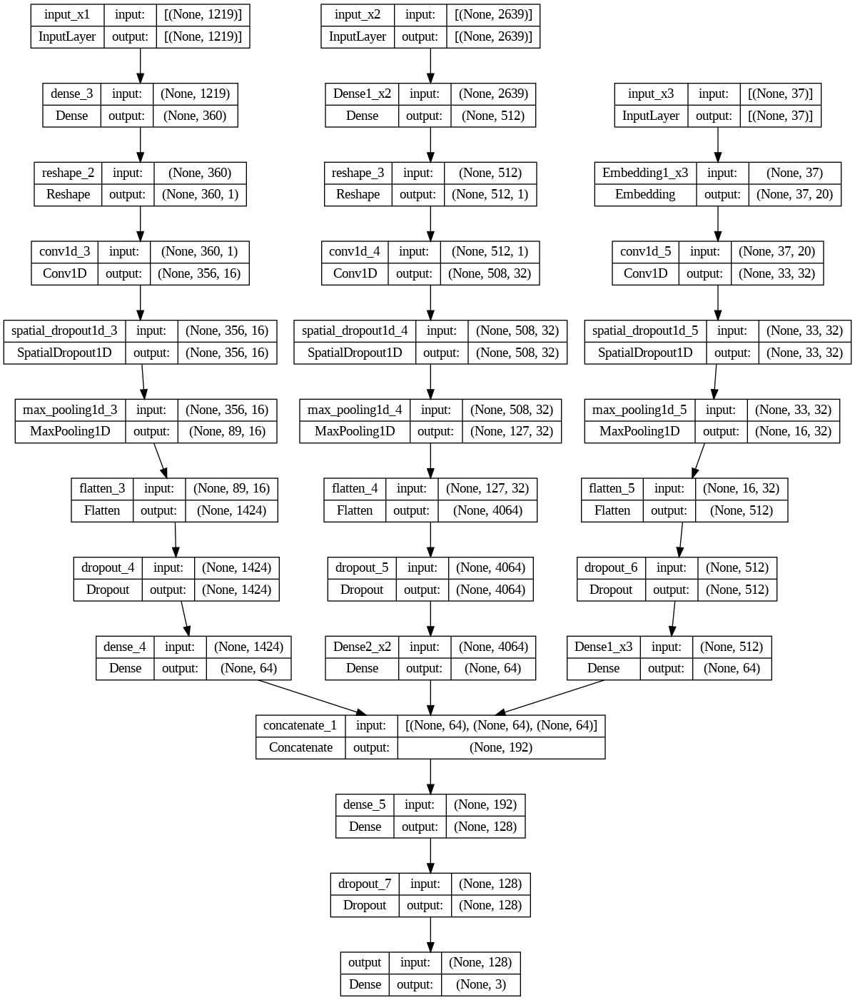

In [ ]:
# Её структура
utils.plot_model(model, show_shapes=True)

In [ ]:
# Компиляция и обучение
#model.compile(optimizer=RMSprop(learning_rate=0.0001), loss='categorical_crossentropy', metrics=[Precision()])
model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=[tfa.metrics.F1Score(num_classes=3),'accuracy'])
history1 = model.fit({'input_x1':x_data1,'input_x2':x_data2,'input_x3':x_data3}, y_data, batch_size=64, validation_split=0.2, epochs=40, verbose=1, callbacks=mycolback, shuffle=True)

Epoch 1/40
150/150 [==============================] - ETA: 0s - loss: 0.9313 - f1_score: 0.2682 - accuracy: 0.6088
Epoch 1: val_accuracy improved from -inf to 0.62390, saving model to /content/drive/MyDrive/profpatolog/model_7.h5
150/150 [==============================] - 15s 75ms/step - loss: 0.9313 - f1_score: 0.2682 - accuracy: 0.6088 - val_loss: 0.8289 - val_f1_score: 0.2561 - val_accuracy: 0.6239
Epoch 2/40
150/150 [==============================] - ETA: 0s - loss: 0.7253 - f1_score: 0.4478 - accuracy: 0.6673
Epoch 2: val_accuracy improved from 0.62390 to 0.76933, saving model to /content/drive/MyDrive/profpatolog/model_7.h5
150/150 [==============================] - 4s 25ms/step - loss: 0.7253 - f1_score: 0.4478 - accuracy: 0.6673 - val_loss: 0.5746 - val_f1_score: 0.7059 - val_accuracy: 0.7693
Epoch 3/40
145/150 [============================>.] - ETA: 0s - loss: 0.4807 - f1_score: 0.7687 - accuracy: 0.8091
Epoch 3: val_accuracy improved from 0.76933 to 0.83535, saving model to /

In [ ]:
# Компиляция и обучение 2-й этап
#model.compile(optimizer=RMSprop(learning_rate=0.001), loss='categorical_crossentropy', metrics=[Precision()])
#model = load_model('/content/drive/MyDrive/profpatolog/best_9695.h5')
#model = load_model('/content/drive/MyDrive/profpatolog/model_7.h5')
model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=[tfa.metrics.F1Score(num_classes=3),'accuracy'])
history2 = model.fit({'input_x1':x_data1,'input_x2':x_data2,'input_x3':x_data3}, y_data, batch_size=96, validation_split=0.2, epochs=20, verbose=1, callbacks=mycolback, shuffle=True)

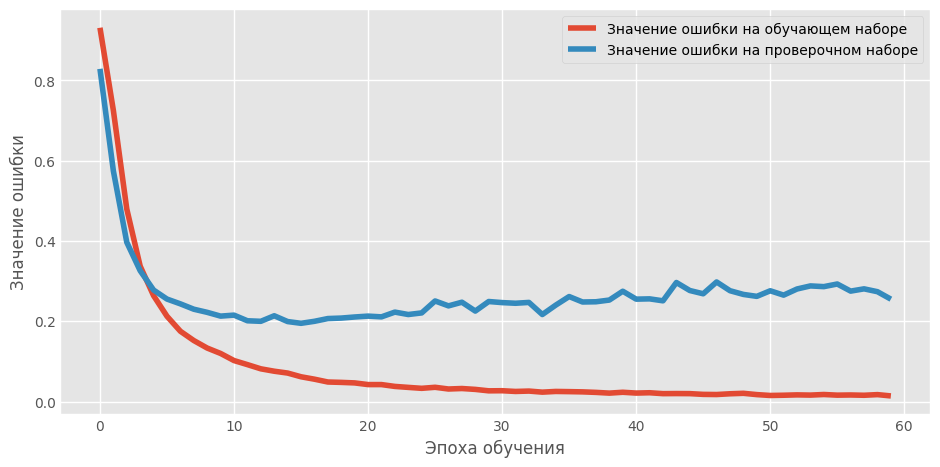

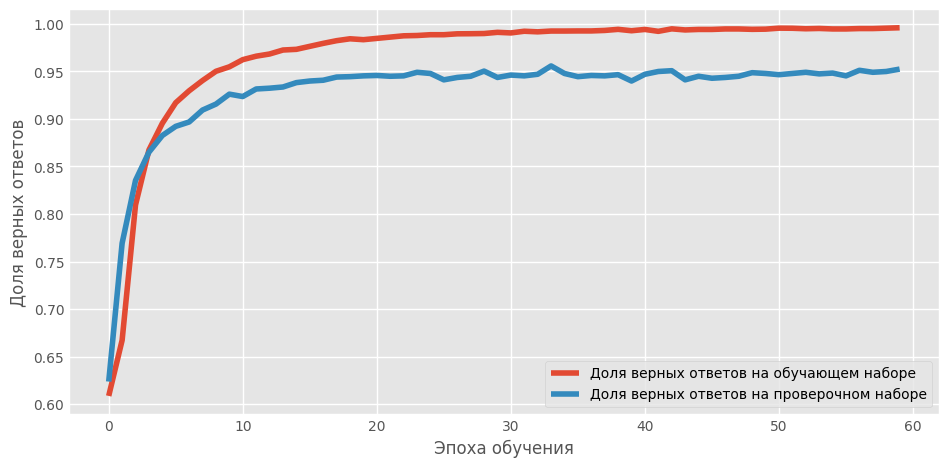

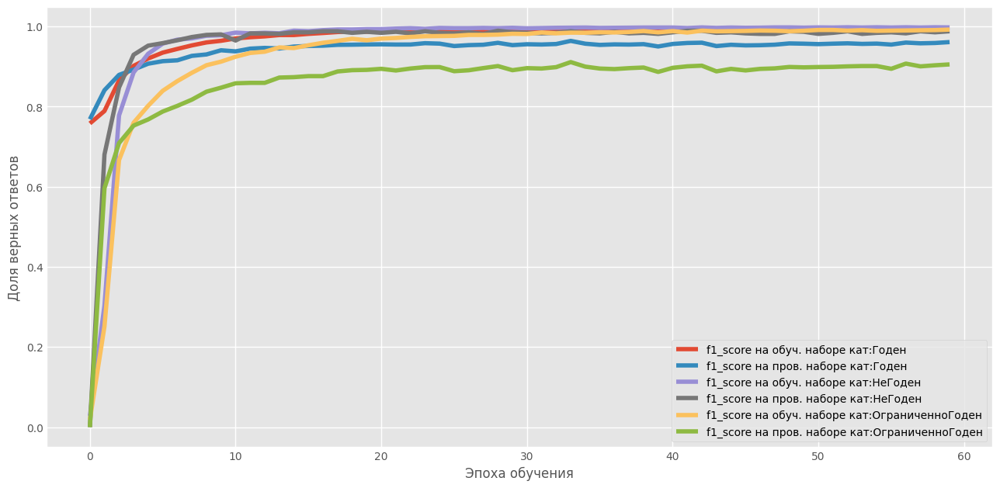

In [ ]:
kat = y_encode['ЗаключениеМК'].classes_
plt.figure(figsize = (10, 5))
plt.plot(history1.history['loss']+history2.history['loss'],
         label='Значение ошибки на обучающем наборе')
plt.plot(history1.history['val_loss']+history2.history['val_loss'],
         label='Значение ошибки на проверочном наборе')
plt.xlabel('Эпоха обучения')
plt.ylabel('Значение ошибки')
plt.style.use('ggplot')
plt.legend()
plt.show()

# Строим график для отображения динамики обучения метрика "accuracy"
plt.figure(figsize = (10, 5))
plt.plot(history1.history['accuracy']+history2.history['accuracy'],
         label='Доля верных ответов на обучающем наборе')
plt.plot(history1.history['val_accuracy']+history2.history['val_accuracy'],
         label='Доля верных ответов на проверочном наборе')
plt.xlabel('Эпоха обучения')
plt.ylabel('Доля верных ответов')
plt.legend(loc='lower right')
plt.show()

# Строим график для отображения динамики обучения метрика "F1Score" по каждому классу
plt.figure(figsize = (14, 7))
for i in range(3):
    plt.plot([history1.history['f1_score'][l][i]  for l in range(len(history1.history['f1_score']))]+[history2.history['f1_score'][k][i]  for k in range(len(history2.history['f1_score']))],
             label=f'f1_score на обуч. наборе кат:{kat[i]}')
    plt.plot([history1.history['val_f1_score'][l][i]  for l in range(len(history1.history['f1_score']))]+[history2.history['val_f1_score'][k][i]  for k in range(len(history2.history['f1_score']))],
             label=f'f1_score на пров. наборе кат:{kat[i]}')
plt.xlabel('Эпоха обучения')
plt.ylabel('Доля верных ответов')
plt.legend(loc='lower right')
plt.show()

In [ ]:
from tensorflow.keras.models import load_model
model = load_model('/content/drive/MyDrive/profpatolog/model_7.h5')
#model = load_model('/content/drive/MyDrive/profpatolog/model_9808.h5')

1/1 [==============================] - 1s 717ms/step


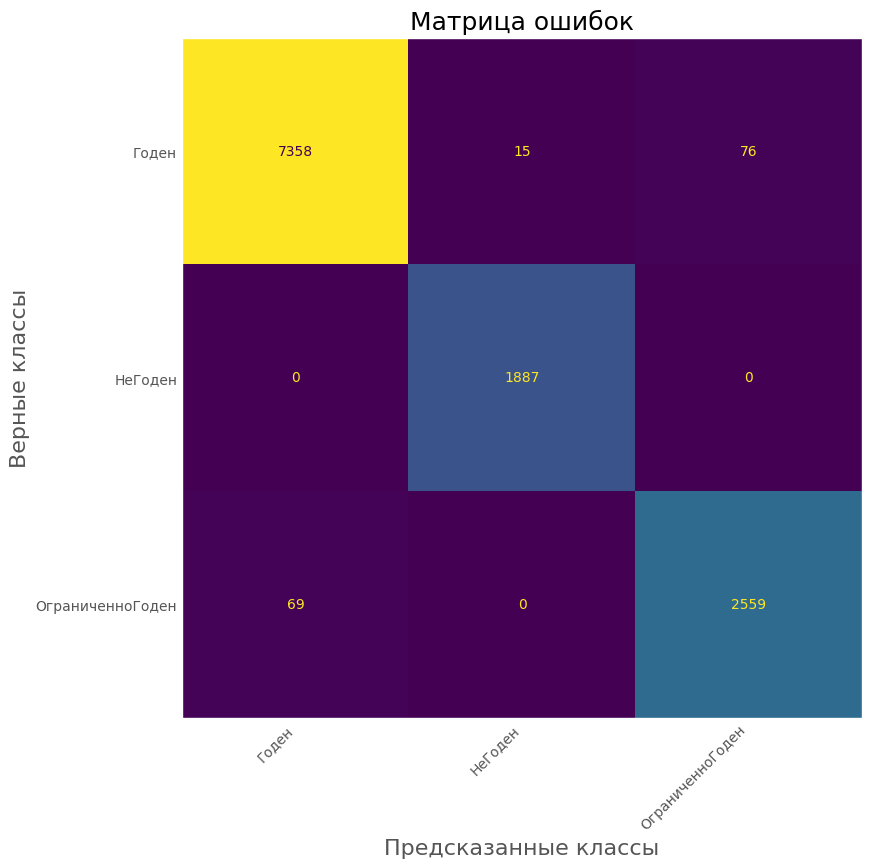

In [ ]:
# Вывод матрицы ошибок предсказания
x = {'input_x1':x_data1,'input_x2':x_data2,'input_x3':x_data3}
# Вычисление предсказания сети
y_pred = model.predict(x,batch_size=x_data1.shape[0])
# Построение матрицы ошибок
cm = confusion_matrix(np.argmax(y_data, axis=1),
                      np.argmax(y_pred, axis=1))
# Округление значений матрицы ошибок если применена нормализация
#cm = np.around(cm, 2)

# Отрисовка матрицы ошибок
fig, ax = plt.subplots(figsize=(10, 10))
ax.set_title(f'Матрица ошибок', fontsize=18)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=kat)
disp.plot(ax=ax)
plt.style.use('fivethirtyeight')
plt.grid(None)
plt.gca().images[-1].colorbar.remove()
plt.xlabel('Предсказанные классы', fontsize=16)
plt.ylabel('Верные классы', fontsize=16)
fig.autofmt_xdate(rotation=45)
plt.show()

# Реализация раздела рекомендаций

In [ ]:
# Загрузка обученной модели
model = load_model('/content/drive/MyDrive/profpatolog/model_7.h5')
#model = load_model('/content/drive/MyDrive/profpatolog/model_9808.h5')
# Восстановление переменных для работы с обученной моделью
with open('/content/drive/MyDrive/profpatolog/datas_all.pkl', "rb") as f: # Открывем файл в формате чтение
    selected_col,tokenizer_prof,tokenizer_bed,tokenizer_dz,tokenizer_mkb,tokenizer_ceh,list_encode,y_encode,ohe_col,max_len = pkl.load(f)
# Проверка
print(len(selected_col))

9


In [ ]:
# Загрузим 1-й датафрейм, как самый полный с "правильной" колонкой "ЗаключениеМК"
df_cor = pd.read_csv('/content/drive/MyDrive/profpatolog/df_cor_1_1.csv')
df_cor.shape

<ipython-input-236-c7d3c5b7891a>:2: DtypeWarning: Columns (43,44,45,46,47,48,54,55,56,57,58,59,60,61,62,63,64,65,77,78,81,85,86,87,88,89,90,91,92,109,113,121,123,125,127,162,163,164,168,169,170,171,172,173,195,196,201,202,203,204,205,206,207,208,228,270,271,272,273,282,283,284,285,286,287,293,294,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,324,326,328,330,331,332,334,336,338,340,342,344,346,348,350,351,352,353,354,355,356,363,364,365,366,367,370,393,395,397,399,401,403,405,406,407,419,434,435,436,437,438,439,440,441,442,443,444,445,447,449,451,453,455,457,459,483,484,485,486,491,492,514,515,526,527,528,529,530,531,537,538,539,540,549,550,552,553,554,555,564,565,579,581,585,587,589,591,593,595,597,599,601,603,605,607,609,611,613,615,617,619,621,623,625,627,629,631,634,635,637,644,645,646,647,648,651,652,653,654,655,681,682,693,694,705,708,711,712,786,787,788,800,806,807,808,809,831,832,833,834,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,85

(1571, 4587)

In [ ]:
df_cor[df_cor['ЗаключениеМК'] == 'НеГоден']

,ДокументПрохождениеМедосмотра,Клиент,КлиентДатаРождения,КлиентПол,КлиентПолПредставление,ДатаЗавершенияМедосмотра,ТипМедосмотра,ТипМедосмотраПредставление,ПсихОсвидетельствование,Контрагент,...,Оториноларингология3_Аудиометрия1_Значение,Оториноларингология3_Аудиометрия1_ЗначениеПредставление,Оториноларингология1_ЖалобыДополнение_Значение,Оториноларингология1_ЖалобыДополнение_ЗначениеПредставление,Стоматология2_ВП2_Значение,Стоматология2_ВП2_ЗначениеПредставление,Терапия2_ЗаключениеФОГК_Значение,Терапия2_ЗаключениеФОГК_ЗначениеПредставление,Офтальмология1_ДвигательныйАппаратГлазДополнение_Значение,Офтальмология1_ДвигательныйАппаратГлазДополнение_ЗначениеПредставление
177,2aeafece-4874-11ed-8107-0cc47aab8067,f48854a1-4868-11ed-8107-0cc47aab8067,1987-03-06,Мужской,Мужской,2022-10-10,Периодический,Периодический,False,10bd7eb8-3586-11ed-8105-0cc47aab8067,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
182,eab3ac0a-484c-11ed-8107-0cc47aab8067,ddb457d3-1451-11e7-80d3-708bcd7f83cd,1986-07-23,Мужской,Мужской,2022-10-10,Периодический,Периодический,False,e8b70525-bcef-11e8-80ce-0cc47aab8067,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
375,32503214-55ac-11ed-8108-0cc47aab8067,116fe6a1-455f-11ed-8107-0cc47aab8067,1961-08-12,Мужской,Мужской,2022-10-27,Периодический,Периодический,False,bd085484-1d16-11ed-8103-0cc47aab8067,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
388,fc62264f-55aa-11ed-8108-0cc47aab8067,116fe6a3-455f-11ed-8107-0cc47aab8067,1968-07-22,Мужской,Мужской,2022-10-27,Периодический,Периодический,False,bd085484-1d16-11ed-8103-0cc47aab8067,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
396,fc62264f-55aa-11ed-8108-0cc47aab8067,116fe6a3-455f-11ed-8107-0cc47aab8067,1968-07-22,Мужской,Мужской,2022-10-27,Периодический,Периодический,False,bd085484-1d16-11ed-8103-0cc47aab8067,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
479,86c6a4ea-58c9-11ed-8108-0cc47aab8067,70a2abb0-045d-11ea-80d3-0cc47aab8067,1969-07-14,Женский,Женский,2022-10-31,Периодический,Периодический,False,f92e1e40-9f09-11e9-80cf-0cc47aab8067,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
861,fc32d76f-60bc-11ed-8109-0cc47aab8067,325d51cc-60a0-11ed-8109-0cc47aab8067,1987-10-26,Мужской,Мужской,2022-11-10,Периодический,Периодический,False,c9d539ae-91a3-11e9-80cf-0cc47aab8067,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1052,ccc98b32-6566-11ed-8109-0cc47aab8067,f01db06a-5a81-11ed-8108-0cc47aab8067,1966-08-20,Мужской,Мужской,2022-11-16,Периодический,Периодический,False,3357cf50-775a-11eb-80e8-0cc47aab8067,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1404,126d913c-6c74-11ed-8109-0cc47aab8067,0e6eb1ea-665f-11ed-8109-0cc47aab8067,1968-01-01,Мужской,Мужской,2022-11-25,Периодический,Периодический,False,bb4d4c59-1f29-11eb-80e3-0cc47aab8067,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1413,cfb68f13-6ecf-11ed-8109-0cc47aab8067,baaae8f7-6210-11ec-80fc-0cc47aab8067,1970-01-01,Мужской,Мужской,2022-11-28,Периодический,Периодический,False,0b15bc61-618c-11ec-80fc-0cc47aab8067,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Выберем одну из записей и сформируем из неё "входной" вектор
indx = 182
df_sel = df_cor.iloc[indx:indx+1]
#df_sel = df_sel[selected_col]
df_sel

,ДокументПрохождениеМедосмотра,Клиент,КлиентДатаРождения,КлиентПол,КлиентПолПредставление,ДатаЗавершенияМедосмотра,ТипМедосмотра,ТипМедосмотраПредставление,ПсихОсвидетельствование,Контрагент,...,Оториноларингология3_Аудиометрия1_Значение,Оториноларингология3_Аудиометрия1_ЗначениеПредставление,Оториноларингология1_ЖалобыДополнение_Значение,Оториноларингология1_ЖалобыДополнение_ЗначениеПредставление,Стоматология2_ВП2_Значение,Стоматология2_ВП2_ЗначениеПредставление,Терапия2_ЗаключениеФОГК_Значение,Терапия2_ЗаключениеФОГК_ЗначениеПредставление,Офтальмология1_ДвигательныйАппаратГлазДополнение_Значение,Офтальмология1_ДвигательныйАппаратГлазДополнение_ЗначениеПредставление
182,eab3ac0a-484c-11ed-8107-0cc47aab8067,ddb457d3-1451-11e7-80d3-708bcd7f83cd,1986-07-23,Мужской,Мужской,2022-10-10,Периодический,Периодический,False,e8b70525-bcef-11e8-80ce-0cc47aab8067,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
df_sel['Цех']

182    NaN
Name: Цех, dtype: object

In [ ]:
# Удалим все колонки не имеющие записей как беполезные
df_sel['Цех'] = 'Не указан'
df_sel = df_sel.dropna(axis=1, how='all')
df_sel.shape

<ipython-input-240-c7b034f6d7b7>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sel['Цех'] = 'Не указан'


(1, 589)

In [ ]:
# Составим список колонок
cols_list = df_sel.columns.tolist()
# отберем колонки с МКБ и Диагнозами в отдельные списки для дальнейщей обработки
col_mkb = []
col_dz = []
for col in cols_list:
    if 'МКБ' in col:
        col_mkb.append(col)
    elif 'Диагноз' in col and 'Представление' in col and 'Значение' not in col:
        col_dz.append(col)
print(f'Отобрано колонок МКБ - {len(col_mkb)}, колонок с диагнозами - {len(col_dz)}')

Отобрано колонок МКБ - 8, колонок с диагнозами - 8


In [ ]:
sel_col = ['Клиент','КлиентДатаРождения','ДатаЗавершенияМедосмотра','КлиентПол','Цех','Профессия','ЗаключениеМК',
           'ВредныеФакторы']
sel_col.extend(col_mkb)
sel_col.extend(col_dz)
sel_col

['Клиент',
 'КлиентДатаРождения',
 'ДатаЗавершенияМедосмотра',
 'КлиентПол',
 'Цех',
 'Профессия',
 'ЗаключениеМК',
 'ВредныеФакторы',
 'ПсихиатрияНаркология1_МКБ101',
 'Офтальмология1_МКБ101',
 'Оториноларингология1_МКБ101',
 'Рентгенология1_МКБ101',
 'Неврология1_МКБ101',
 'Терапия1_МКБ101',
 'Хирургия1_МКБ101',
 'ПроцедурнаяМедсестра1_МКБ101',
 'ПсихиатрияНаркология1_ДиагнозПредставление1',
 'Офтальмология1_ДиагнозПредставление1',
 'Оториноларингология1_ДиагнозПредставление1',
 'Рентгенология1_ДиагнозПредставление1',
 'Неврология1_ДиагнозПредставление1',
 'Терапия1_ДиагнозПредставление1',
 'Хирургия1_ДиагнозПредставление1',
 'ПроцедурнаяМедсестра1_ДиагнозПредставление1']

In [ ]:
# Подготовка данных для нейронки
df_data = df_sel[sel_col]
print(df_data.shape)

(1, 24)


In [ ]:
df_data = concate_col(df_data,col_mkb,8,'МКБ')
df_data = concate_col(df_data,col_dz,9,'Диагнозы')

In [ ]:
# Заменим колонку "КлиентДатаРождения" на колонку возраст "AGE" в формате под AHE
col_bsd = df_data.columns.get_loc('КлиентДатаРождения')
col_dt = df_data.columns.get_loc('ДатаЗавершенияМедосмотра')
df_data = set_age (df_data,col_bsd,col_dt)

In [ ]:
df_data

,Клиент,AGE,ДатаЗавершенияМедосмотра,КлиентПол,Цех,Профессия,ЗаключениеМК,ВредныеФакторы,МКБ,Диагнозы,...,Хирургия1_МКБ101,ПроцедурнаяМедсестра1_МКБ101,ПсихиатрияНаркология1_ДиагнозПредставление1,Офтальмология1_ДиагнозПредставление1,Оториноларингология1_ДиагнозПредставление1,Рентгенология1_ДиагнозПредставление1,Неврология1_ДиагнозПредставление1,Терапия1_ДиагнозПредставление1,Хирургия1_ДиагнозПредставление1,ПроцедурнаяМедсестра1_ДиагнозПредставление1
182,ddb457d3-1451-11e7-80d3-708bcd7f83cd,3,2022-10-10,Мужской,Не указан,Водитель автомобиля 6 разряда,НеГоден,"11.1,18.1",Z00.0 I11.9,Общий медицинский осмотр Гипертензивная [гипер...,...,Z00.0,Z00.0,Общий медицинский осмотр,Общий медицинский осмотр,Общий медицинский осмотр,Общий медицинский осмотр,Общий медицинский осмотр,Гипертензивная [гипертоническая] болезнь с пре...,Общий медицинский осмотр,Общий медицинский осмотр


In [ ]:
df_data = df_data[selected_col]
df_data

,Клиент,AGE,КлиентПол,Цех,Профессия,ЗаключениеМК,ВредныеФакторы,МКБ,Диагнозы
182,ddb457d3-1451-11e7-80d3-708bcd7f83cd,3,Мужской,Не указан,Водитель автомобиля 6 разряда,НеГоден,"11.1,18.1",Z00.0 I11.9,Общий медицинский осмотр Гипертензивная [гипер...


In [ ]:
# Уберем самые распространенные значения где это возможно
val_mkb = 'Z00.0 '
val_dz = 'Общий медицинский осмотр '
mkb_col = df_data.columns.get_loc('МКБ')
dz_col = df_data.columns.get_loc('Диагнозы')
df_data = clear_col(df_data, mkb_col, val_mkb)
df_data = clear_col(df_data, dz_col, val_dz)

In [ ]:
df_data

,Клиент,AGE,КлиентПол,Цех,Профессия,ЗаключениеМК,ВредныеФакторы,МКБ,Диагнозы
182,ddb457d3-1451-11e7-80d3-708bcd7f83cd,3,Мужской,Не указан,Водитель автомобиля 6 разряда,НеГоден,"11.1,18.1",I11.9,Гипертензивная [гипертоническая] болезнь с пре...


In [ ]:
x_data, list_code, list_encode = df_to_ohe(df_data,['AGE','КлиентПол'],list_encode)
x_data.shape

False
Кодируется колонка AGE - Успешно
Кодируется колонка КлиентПол - Успешно


(1, 12)

In [ ]:
# Получение BOW по токенайзерам
bow_ceh = tokenizer_ceh.texts_to_matrix(df_data['Цех'].tolist())
bow_mkb = tokenizer_mkb.texts_to_matrix(df_data['МКБ'].tolist())
bow_bed = tokenizer_bed.texts_to_matrix(df_data['ВредныеФакторы'].tolist())
bow_prof = tokenizer_prof.texts_to_matrix(df_data['Профессия'].tolist())
bow_dz = tokenizer_dz.texts_to_matrix(df_data['Диагнозы'].tolist())
print('Профессии: ', bow_prof.shape, '\nВр.факторы: ', bow_bed.shape,'\nДигнозы: ', bow_dz.shape,'\nЦех: ', bow_ceh.shape,'\nМКБ: ', bow_mkb.shape )

Профессии:  (1, 1603) 
Вр.факторы:  (1, 152) 
Дигнозы:  (1, 1036) 
Цех:  (1, 655) 
МКБ:  (1, 400)


In [ ]:
#Сборка массива для 1-й ветки
x_data1 = np.hstack([x_data, bow_ceh, bow_bed, bow_mkb])
x_data1.shape

(1, 1219)

In [ ]:
#Сборка массива для 2-й ветки
x_data2 = np.hstack([bow_dz, bow_prof])
x_data2.shape

(1, 2639)

In [ ]:
# Получим словарь частотности для клонки 'Диагнозы' для embedding слоя
x_seq = tokenizer_dz.texts_to_sequences(df_data['Диагнозы'].tolist())
print(len(x_seq))

1


In [ ]:
# Создадим массив для 3-й ветки
x_data3 = np.zeros((len(x_seq),max_len))
for i in range(len(x_seq)):
    for j in range(len(x_seq[i])):
        x_data3[i,j] = x_seq[i][j]
print(x_data3.shape)
print(x_data3[0])

(1, 37)
[10. 12.  8.  7. 13. 11.  9.  3. 14. 15. 16.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.]


In [ ]:
kat = y_encode['ЗаключениеМК'].classes_
kat

array(['Годен', 'НеГоден', 'ОграниченноГоден'], dtype='<U16')

In [ ]:
from tensorflow.python.distribute.distribute_lib import values
# Формирование входного массива данных
x = {'input_x1':x_data1,'input_x2':x_data2,'input_x3':x_data3}
# Вычисление предсказания сети
y_pred = model.predict(x,batch_size=x_data1.shape[0])
print(y_pred)
model_pred = y_encode['ЗаключениеМК'].classes_[np.argmax(y_pred)]
print(f"Предсказание модели -  {model_pred}")
#df_test = df_cor.iloc[indx:indx+1]
#df_test = df_test.dropna(axis = 1, how = 'all')
col_list = df_sel.columns.to_list()
#if model_pred == 'Годен':
#    print(f"Исходя из предоставленных данных, пациент не имеет противопоказний для работы в указанных условиях, на должности {df_sel['Профессия'].values[0]}")
#else:
print('Данному пациенту поставлен(ы) следующий(е) диагноз(ы):')
for i in range(len(col_mkb)):
    if df_sel[col_mkb[i]].values[0] != 'Z00.0':
        spec = col_mkb[i].split('_')[0]
        diagnoz = ''
        doctor = ''
        recom = ''
        for j in col_list:
            if spec in j and 'Диагноз' in j and 'Представление' in j :
                diagnoz = diagnoz + str(df_sel[j].values[0])+' '
            elif spec in j and 'Врач' in j and 'Представление' in j :
                doctor = doctor + str(df_sel[j].values[0])+' '
            elif spec in j and 'Специализ' in j and 'Представление' in j :
                doctor = 'Специализация - '+str(df_sel[j].values[0])+'. '
            elif spec in j and 'Рекоменд' in j and 'Представление' in j :
                recom = recom + str(df_sel[j].values[0])+' '
            elif spec in j and 'РекомендацияСТР' in j:
                recom = recom + str(df_sel[j].values[0])+' '
            else:
                continue
        print(f'Врач: {doctor} \n Диагноз МКБ - {df_sel[col_mkb[i]].values[0]} - {diagnoz} \n Рекомендации: {recom}')


1/1 [==============================] - 0s 299ms/step
[[0.42736107 0.571635   0.00100395]]
Предсказание модели -  НеГоден
Данному пациенту поставлен(ы) следующий(е) диагноз(ы):
Врач: Специализация - Терапия. Черепанова Н.А.  
 Диагноз МКБ - I11.9 - Гипертензивная [гипертоническая] болезнь с преимущественным поражением сердца без (застойной) сердечной недостаточности  
 Рекомендации: Наблюдение кардиолога 
